# <b>1 <span style='color:#0000FF'>|</span> Introduction</b>

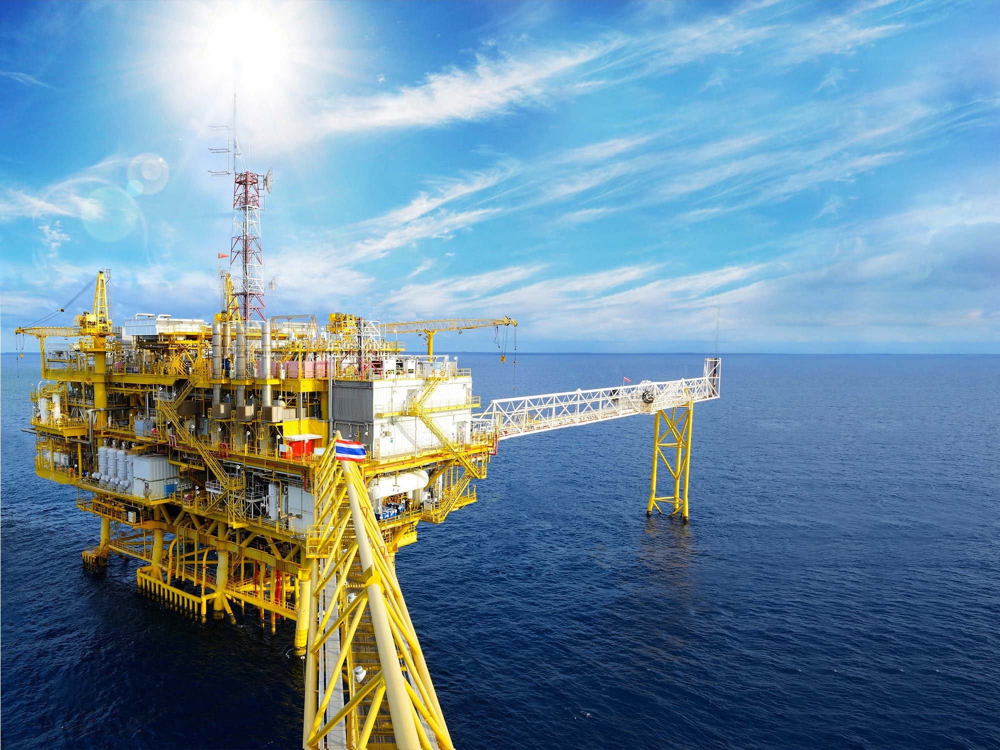

Variable|Description
------- | ---------
DEPT |
MTTVD |
ROP |
KPOSI |
SSS_H |
SSL_H |
RPM_H |
VIBC |
VIBXYH |
VIBZH |
SPP I |
Depth (m) |
  ROP1   (m/hr) |
ROP2 (min/mt) |
WOB |
RPM |
Torque |
SPP |
SPM1 |
SPM2 |
Flow in |
M.Temp in |
M.Temp out |
M.Wt in |
M.Wt out |
DEPT.M  | MWD Tool Measurement Depth
BDEP.M  | Bit Depth
KPOSI.M    |  Kelly Position (Raw)
HKL .KLBF  | Hook Load
SPP .PSI   | Standpipe Pressure
ROP .M/HR  | Rate of Penetration (MWD Depth Ave.)
PSPD.M/MIN | Instantaneous Pipe Speed
VIBC.CPS   | Vibration Count
SSL_H.     |  Stick Slip Level from HDS1
SSS_H.     |  Stick Slip Percentage from HDS1
RPM_H.     |  Average RPM from HDS1
VIBXYH.    | Vibration XY
VIBZH.     |  Vibration Z

# <b>2 <span style='color:#0000FF'>|</span> Importing libraries</b>

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno      ## for missing values
from ydata_profiling  import ProfileReport
from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split
from datasist.structdata import detect_outliers
from IPython.display import Markdown, display

# data modeling 
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor,plot_tree
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_validate
import joblib


import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set(rc={'figure.figsize': [10, 6]}, font_scale=1.3)
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)


<div style="color:yellow;display:fill;border-radius:8px;
            background-color:#0000FF;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:white;"><b>5.2 | Numerical Features </b></p>
</div>

In [117]:
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

def Num_feature_analysis(df, col, target_columns=['Lateral Vib.']):
    # Display summary statistics
    header = f"<div style='text-align: center; color: blue;'><h3>Summary statistics for {col}:</h3></div>"
    display(Markdown(header))
    
    for i, target_col in enumerate(target_columns):
        # Distribution plot
        fig, ax = plt.subplots(figsize=(10, 8))
        sns.distplot(df[col], bins=30, kde=True, ax=ax, color='blue', 
                     kde_kws={'bw': 0.5, 'color': 'black'}, hist_kws={})
        #ax.set_title(f'Distribution of {col} for {target_col}', fontweight='bold', color='blue', fontsize=16)
        ax.set_xlabel(col, fontweight='bold', color='black', fontsize=14)
        ax.set_ylabel('Density', fontweight='bold', color='black', fontsize=14)
        ax.tick_params(axis='x', colors='black', labelsize=12)
        ax.tick_params(axis='y', colors='black', labelsize=12)
        ax.spines['bottom'].set_linewidth(2)  # Set bottom axis line width
        ax.spines['left'].set_linewidth(2)    # Set left axis line width
        ax.spines['left'].set_linewidth(2)    # Set left axis line width
        ax.spines['top'].set_linewidth(2)   # Hide the top axis line
        plt.savefig(f'distplot_{col}_{target_col}.png')
        plt.show()
        plt.close()
        
        # Boxplot with stripplot
        fig, ax = plt.subplots(figsize=(10, 8))
        sns.boxplot(data=df, x=col, ax=ax, color='salmon')
        sns.stripplot(data=df, x=col, color='green', ax=ax, alpha=0.5)
        #ax.set_title(f'Boxplot and Stripplot of {col} for {target_col}', fontweight='bold', color='blue', fontsize=16)
        ax.set_xlabel(col, fontweight='bold', color='black', fontsize=14)
        ax.tick_params(axis='x', colors='black', labelsize=12)
        ax.tick_params(axis='y', colors='black', labelsize=12)
        ax.spines['bottom'].set_linewidth(2)  # Set bottom axis line width
        ax.spines['left'].set_linewidth(2)    # Set left axis line width
        ax.spines['top'].set_linewidth(2)   # Hide the top axis line
        ax.spines['right'].set_linewidth(2) # Hide the right axis line
        plt.savefig(f'boxplot_{col}_{target_col}.png')
        plt.show()
        plt.close()


In [141]:
import pandas as pd

# Reading the CSV file into a DataFrame named well_Data
well_Data = pd.read_csv('clean.csv')

# Selecting specific columns from the DataFrame
well_Data = well_Data[['DEPT','WOB', 'RPM','Flow in','Torque','SPP', '  ROP1   (m/hr)','M.Wt in','M.Temp in', 'M.Temp out','VIBC','VIBXYH', 'VIBZH','SSS_H']]

# rename 
well_Data.columns = ['Depth','WOB', 'RPM','Q','T','SPP', 'ROP','M. Wt','M. T. in', 'M. T. out','Vib. Count','Lateral Vib.','Axial Vib.','SS%']

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Depth</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Depth:</h3></div>

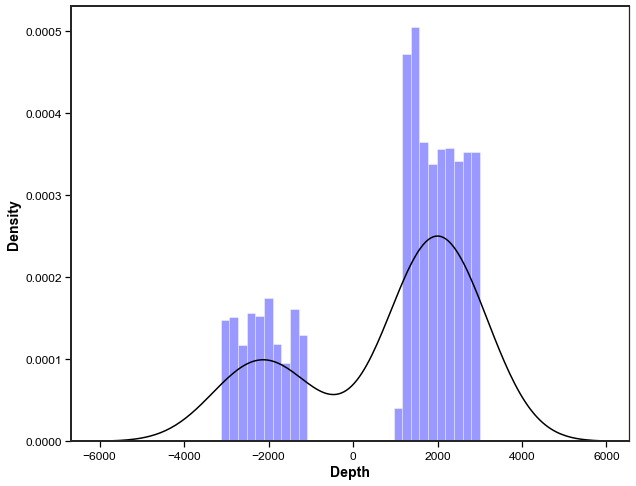

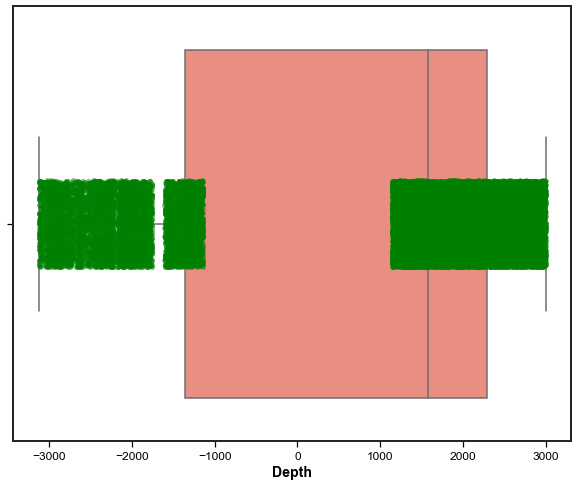

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>WOB</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for WOB:</h3></div>

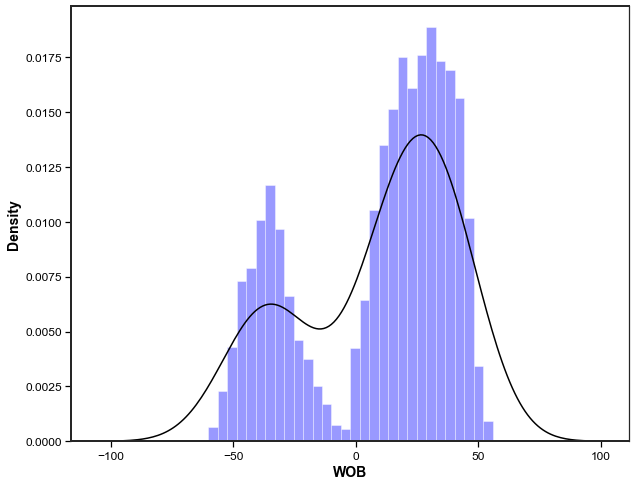

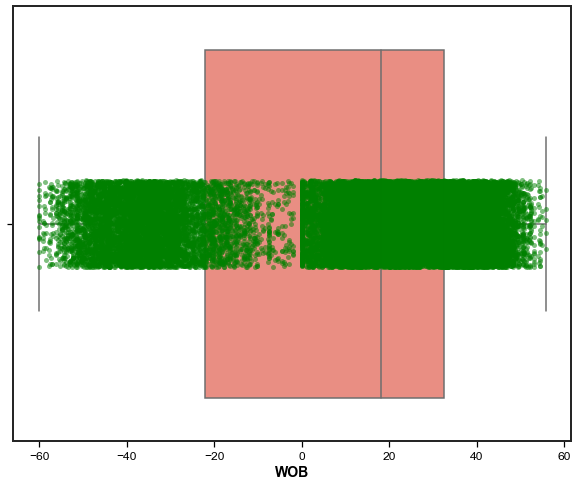

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>RPM</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for RPM:</h3></div>

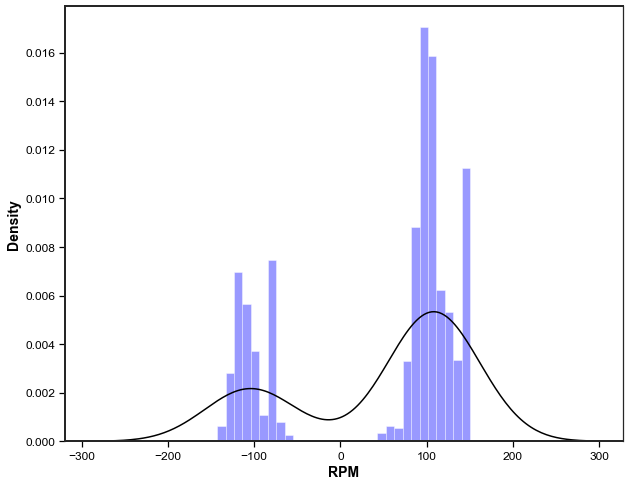

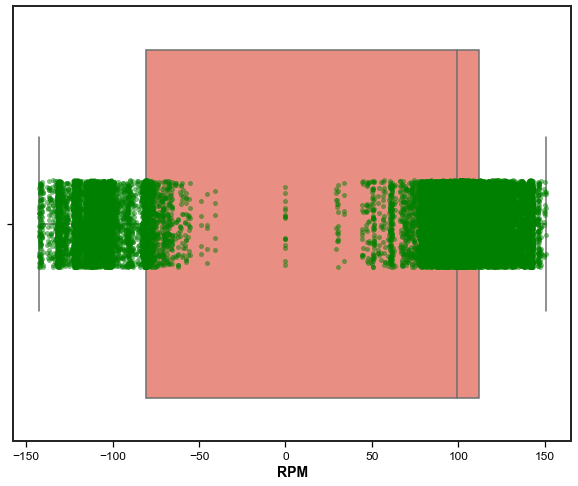

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Q</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Q:</h3></div>

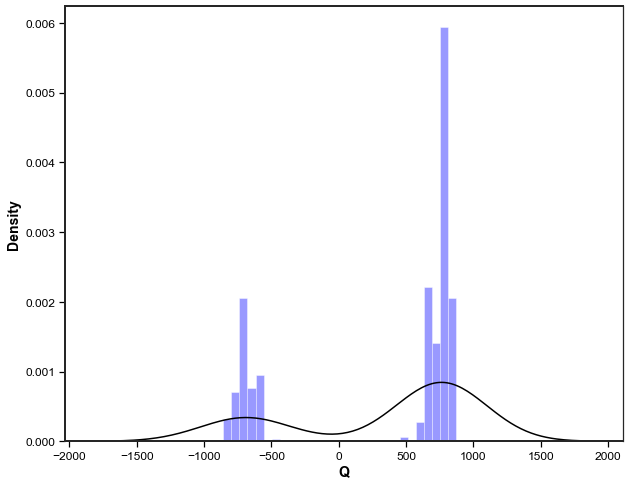

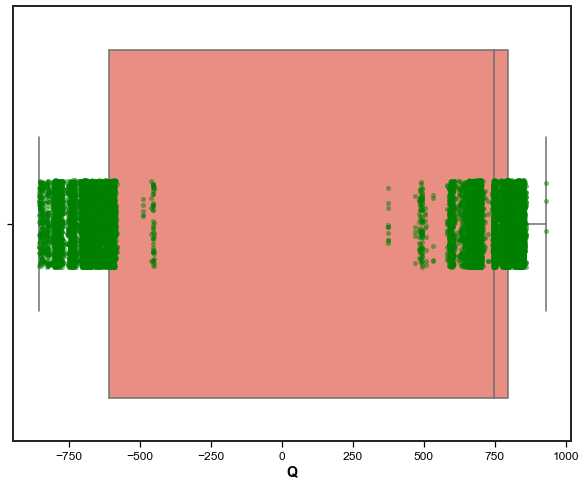

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>T</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for T:</h3></div>

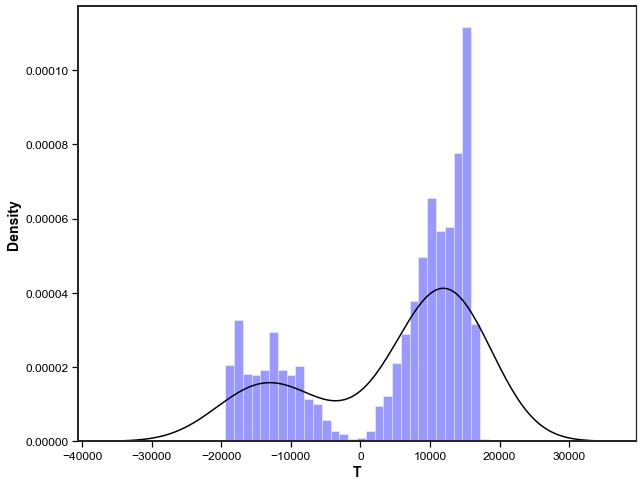

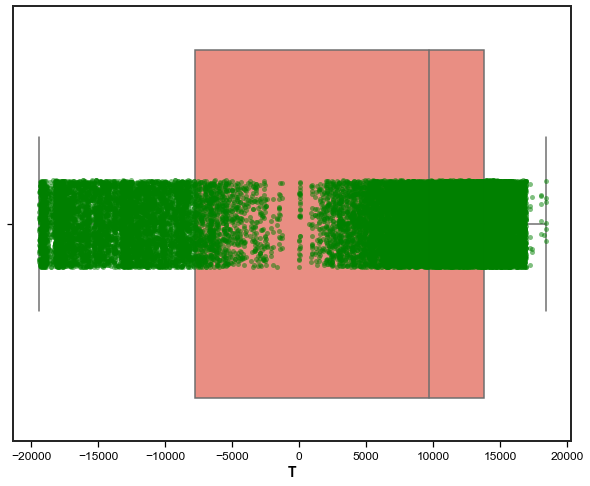

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>SPP</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for SPP:</h3></div>

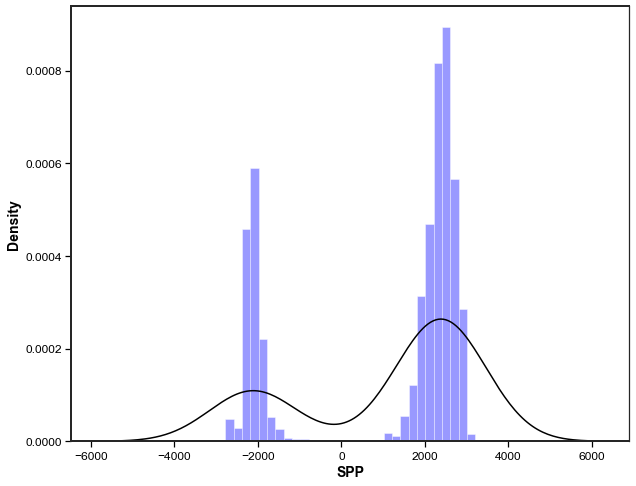

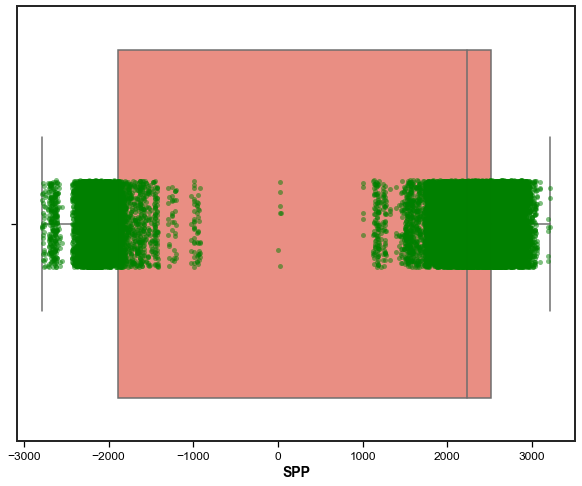

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>ROP</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for ROP:</h3></div>

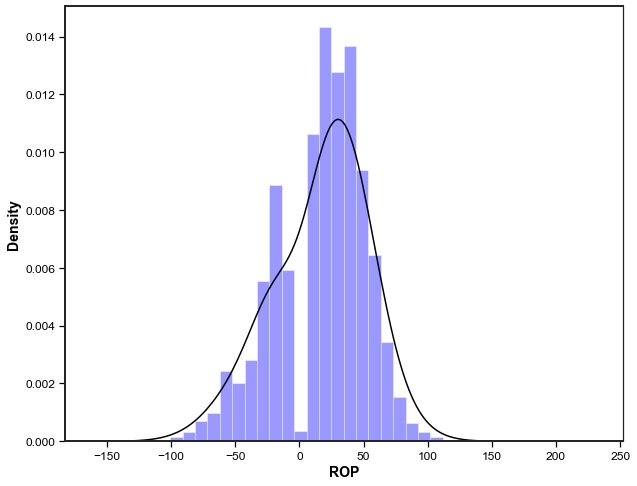

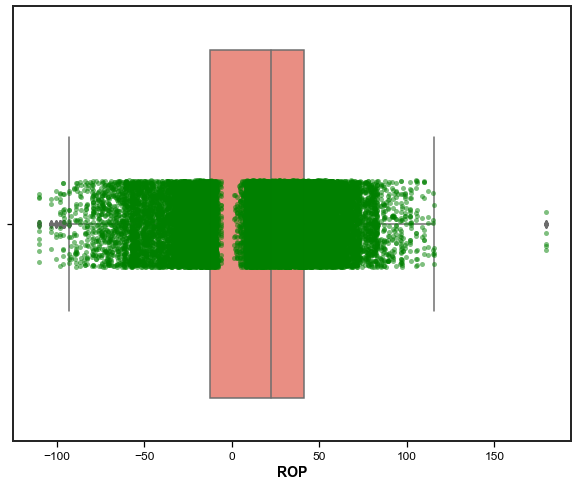

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M. Wt</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M. Wt:</h3></div>

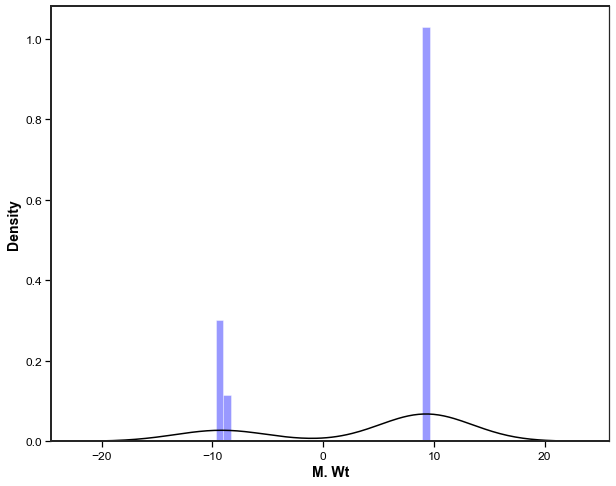

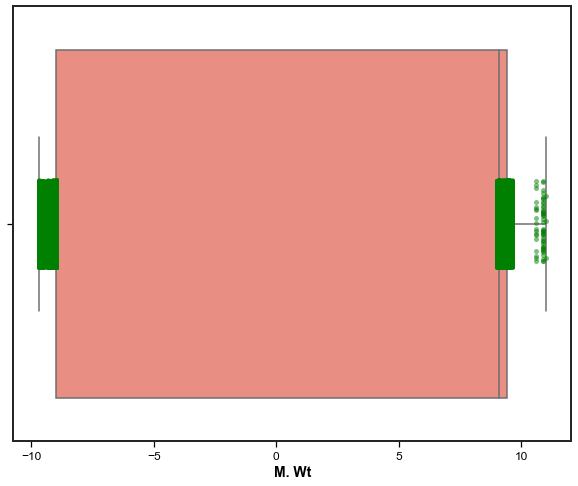

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M. T. in</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M. T. in:</h3></div>

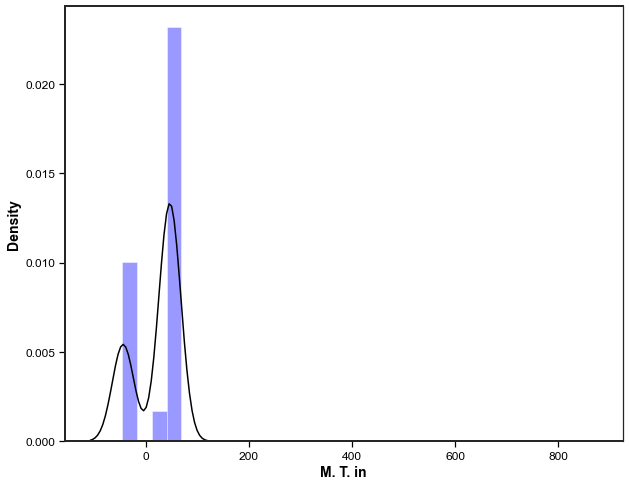

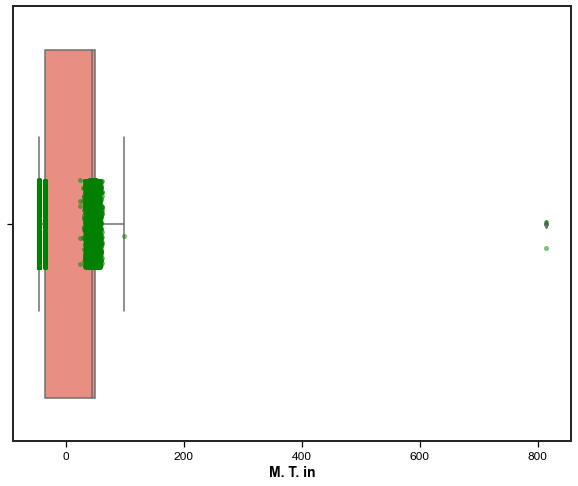

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M. T. out</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M. T. out:</h3></div>

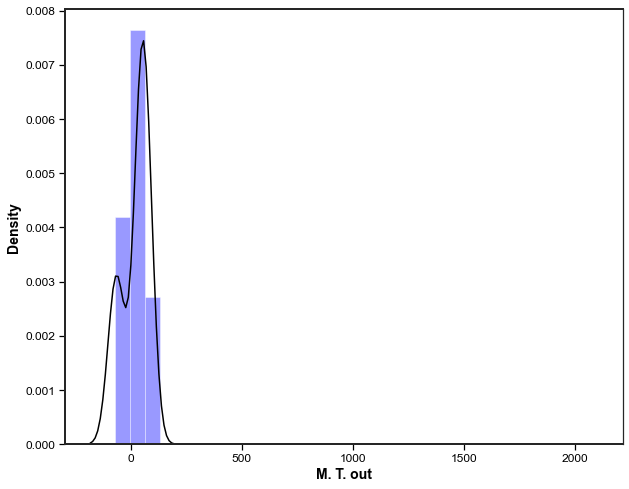

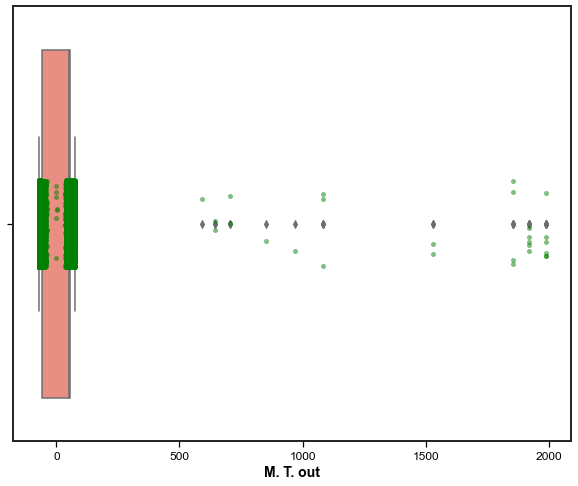

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Vib. Count</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Vib. Count:</h3></div>

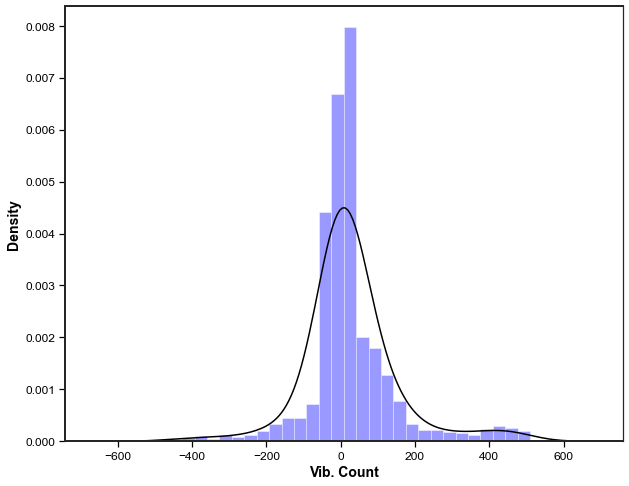

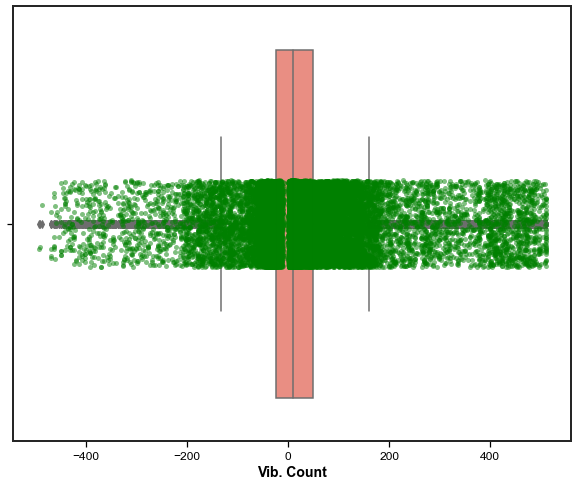

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Lateral Vib.</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Lateral Vib.:</h3></div>

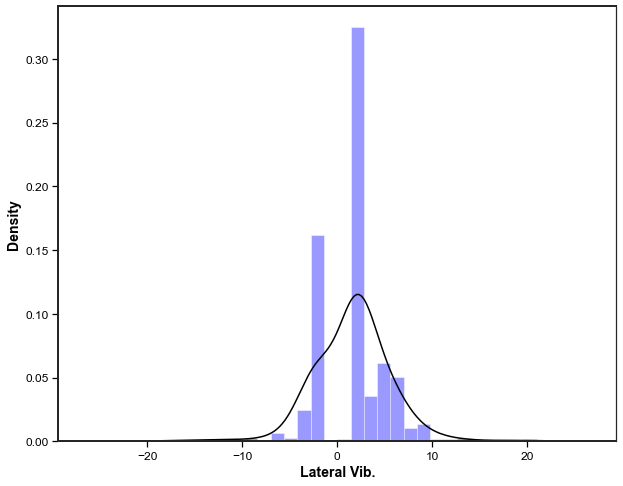

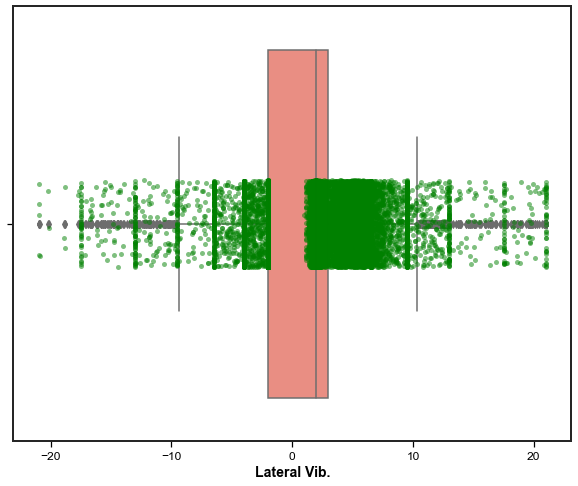

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Axial Vib.</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Axial Vib.:</h3></div>

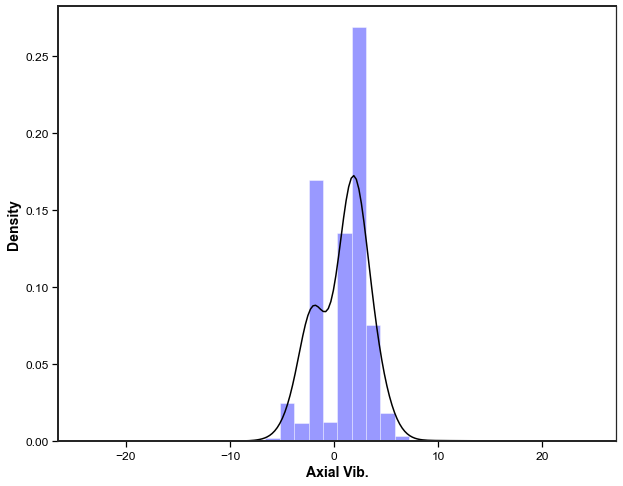

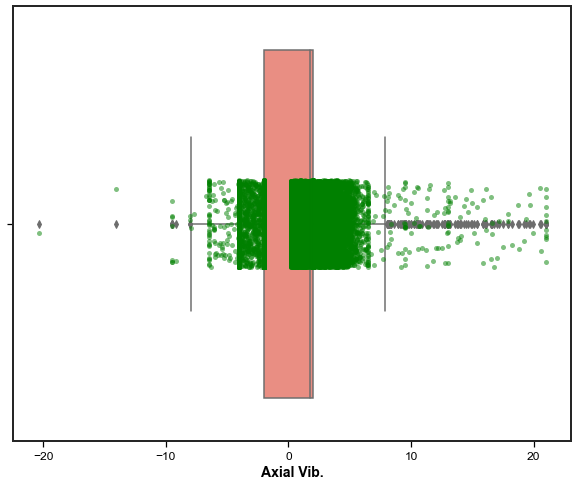

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>SS%</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for SS%:</h3></div>

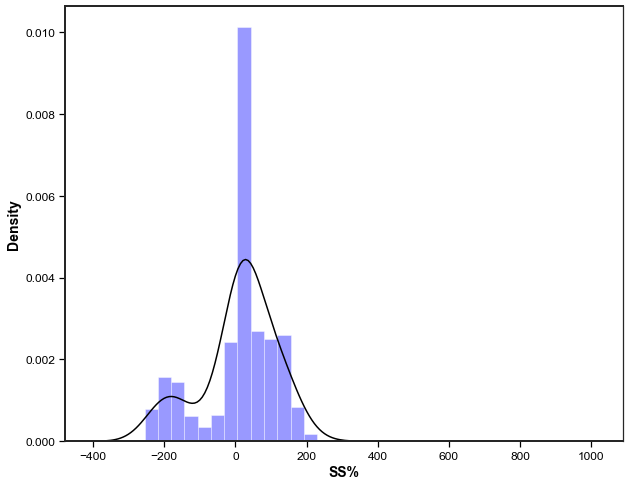

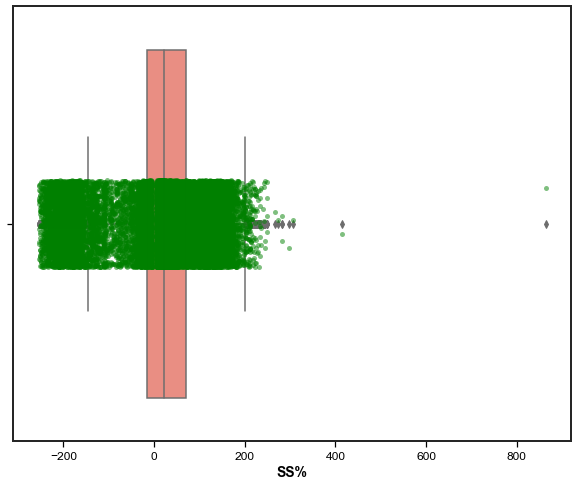

In [142]:
from IPython.display import Markdown, display

# External dictionary with column descriptions
column_descriptions = {
    'MD(mt)': 'Description for Column1.',
    'Column2': 'Description for Column2.',
    # Add descriptions for other columns
}

for col in well_Data.columns:
    # Fetch the description from the external dictionary
    column_description = column_descriptions.get(col, 'No description available.')

    # Create the header with description
    header = f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{col}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Run your analysis function
    Num_feature_analysis(well_Data, col)


### without outliers

In [143]:
import pandas as pd

# Reading the CSV file into a DataFrame named well_Data
well_Data = pd.read_csv('clean.csv')

# Selecting specific columns from the DataFrame
well_Data = well_Data[['DEPT','WOB', 'RPM','Flow in','Torque','SPP', '  ROP1   (m/hr)','M.Wt in','M.Temp in', 'M.Temp out','VIBC','VIBXYH', 'VIBZH','SSS_H']]

# Define function to remove outliers using IQR method
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers and negative values from selected columns
selected_columns = ['WOB', 'RPM', 'Flow in', 'Torque', 'SPP', '  ROP1   (m/hr)', 'M.Wt in', 'M.Temp in', 'M.Temp out', 'VIBC', 'VIBXYH', 'VIBZH', 'SSS_H']
for column in selected_columns:
    # Removing outliers
    well_Data = remove_outliers_iqr(well_Data, column)
    # Removing negative values
    well_Data = well_Data[well_Data[column] >= 0]

# Resetting index after filtering
well_Data.reset_index(drop=True, inplace=True)


In [144]:
well_Data.shape

(13089, 14)

#### Rename Columns

In [145]:
well_Data.columns = ['Depth','WOB', 'RPM','Q','T','SPP', 'ROP','M. Wt','M. T. in', 'M. T. out','Vib. Count','Lateral Vib.','Axial Vib.','SS%']

In [146]:
well_Data.describe().T.style.set_properties(**{'background-color': '#FFFF99','color': 'black','border-color': 'white'})

,count,mean,std,min,25%,50%,75%,max
Depth,13089.000000,2152.077531,580.748941,1146.000000,1566.200000,2228.600000,2669.800000,3002.800000
WOB,13089.000000,26.847862,12.382986,0.000000,17.442280,27.132130,36.768330,55.844430
RPM,13089.000000,112.939833,20.948949,56.510000,98.258480,106.433000,137.670700,147.645100
Q,13089.000000,749.873064,63.386929,580.798200,686.299900,777.756500,794.947000,860.019800
T,13089.000000,11058.579671,3511.613065,922.141700,8641.429000,11146.740000,14178.570000,16979.200000
SPP,13089.000000,2399.446903,317.771647,1560.364000,2176.908000,2431.273000,2635.920000,3187.580000
ROP,13089.000000,34.050991,19.021022,2.674943,17.835570,30.926370,47.766550,87.990710
M. Wt,13089.000000,9.318481,0.169634,9.000000,9.100000,9.400000,9.400000,9.600000
M. T. in,13089.000000,46.311017,4.434265,32.806980,43.580880,47.652080,49.175000,59.448530
M. T. out,13089.000000,57.327706,10.422535,37.157410,51.453300,52.136360,68.622300,74.243220


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Depth</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Depth:</h3></div>

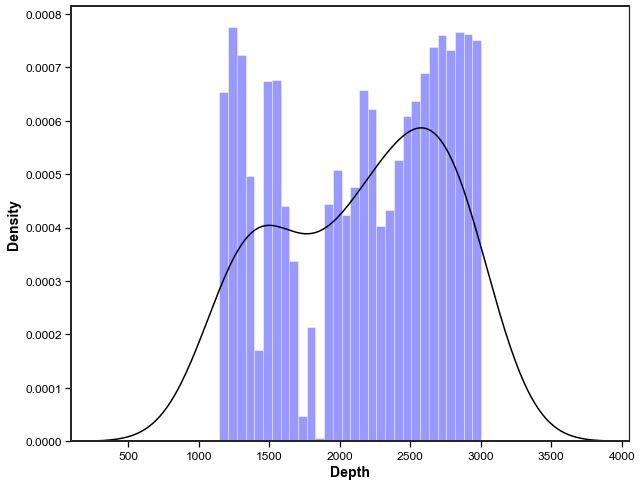

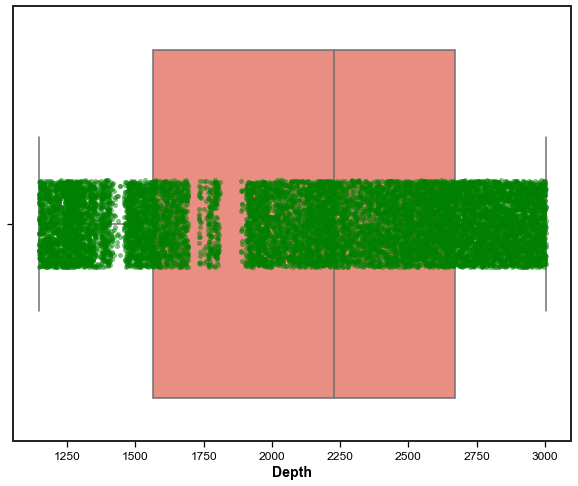

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>WOB</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for WOB:</h3></div>

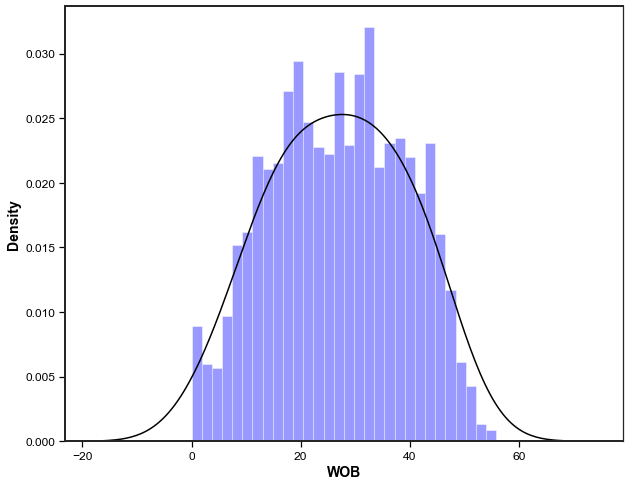

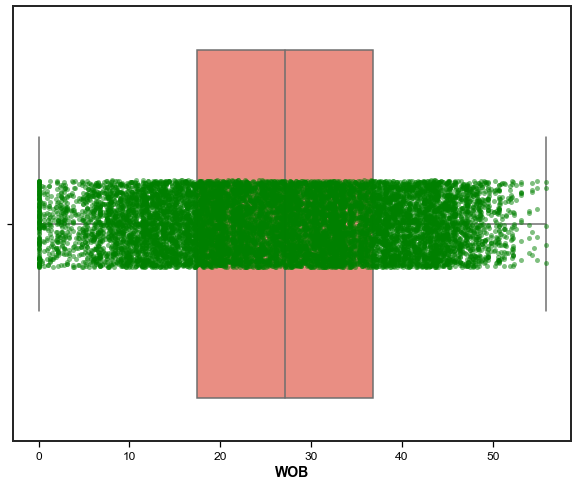

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>RPM</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for RPM:</h3></div>

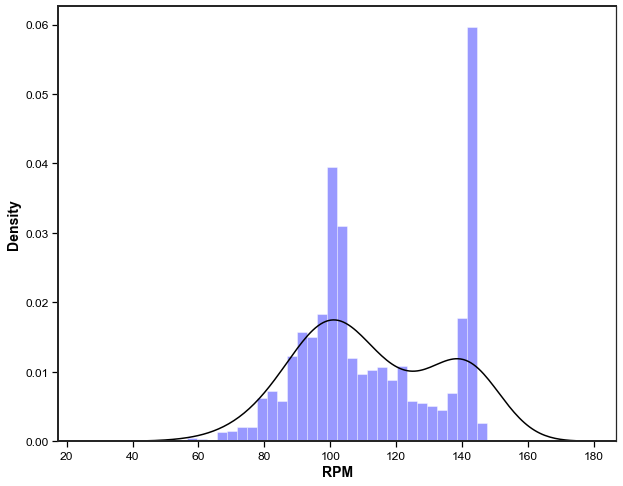

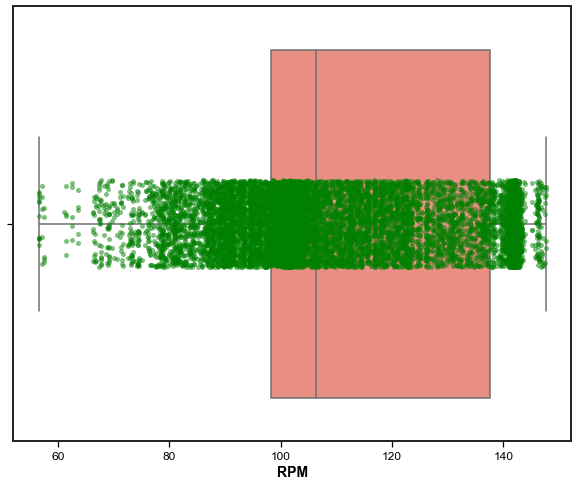

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Q</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Q:</h3></div>

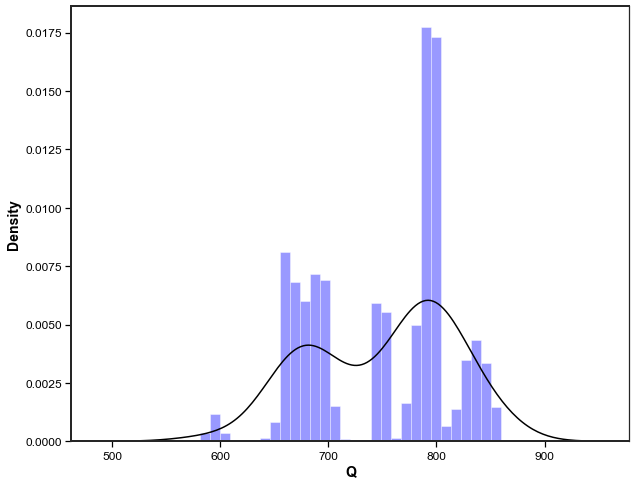

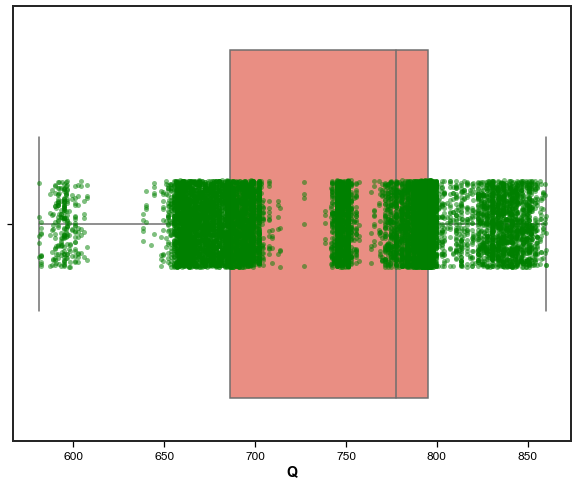

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>T</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for T:</h3></div>

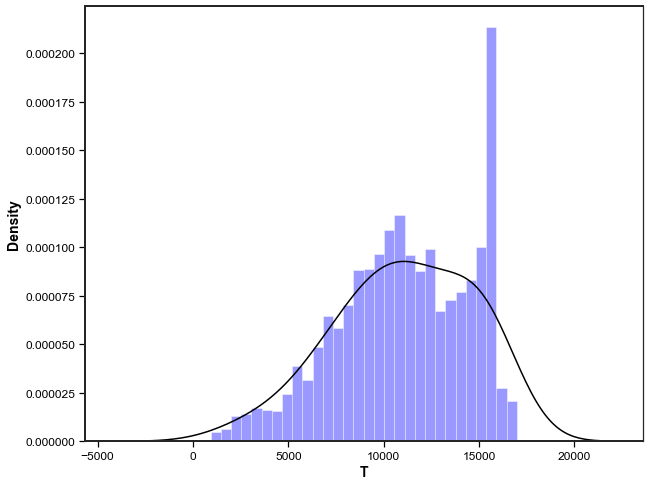

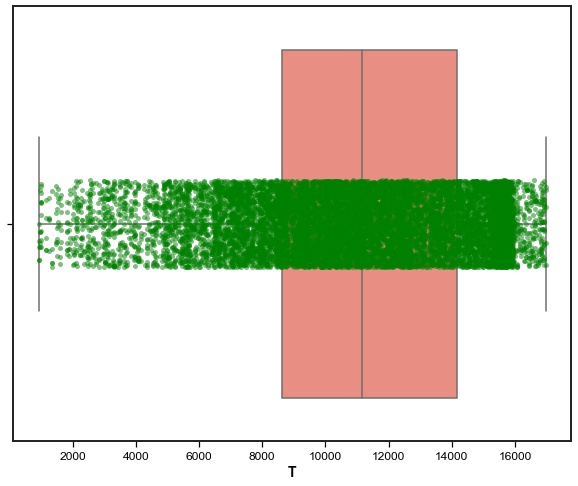

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>SPP</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for SPP:</h3></div>

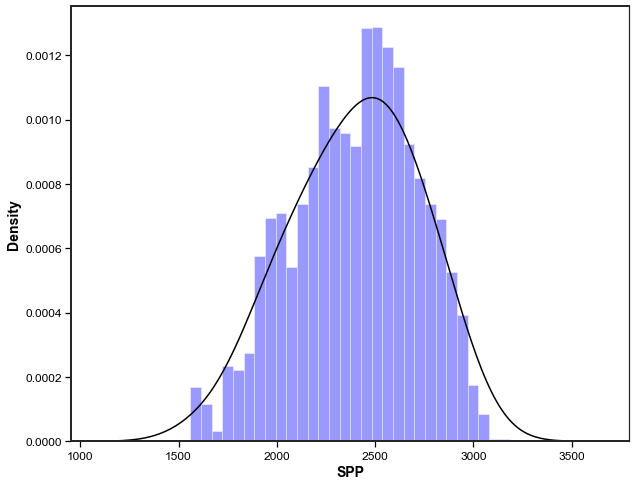

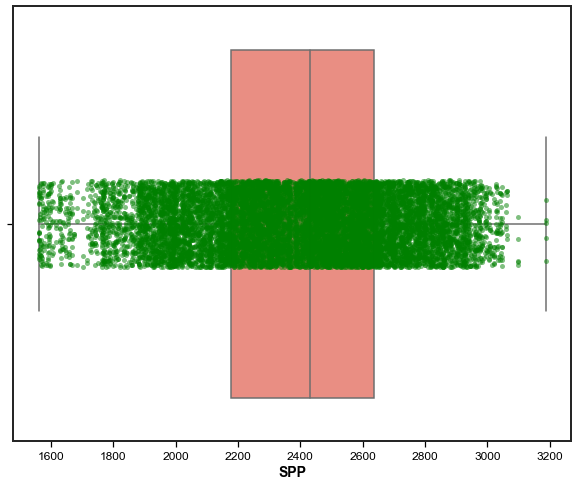

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>ROP</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for ROP:</h3></div>

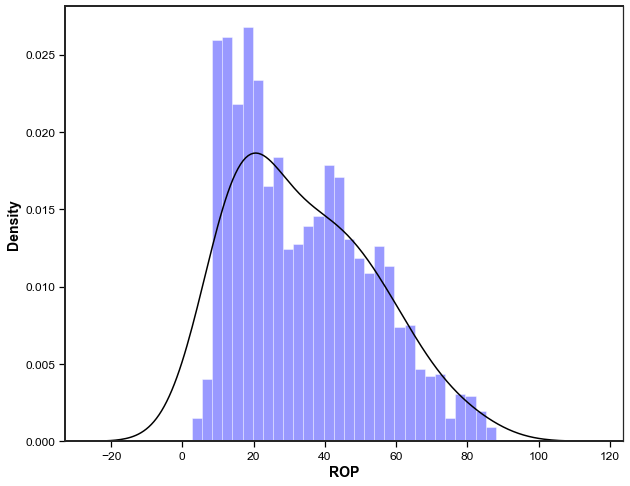

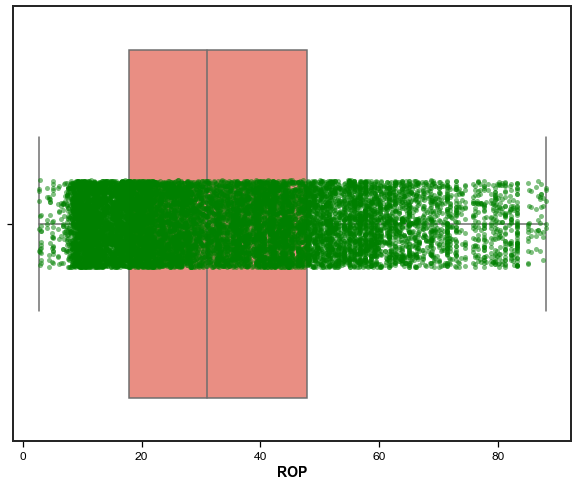

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M. Wt</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M. Wt:</h3></div>

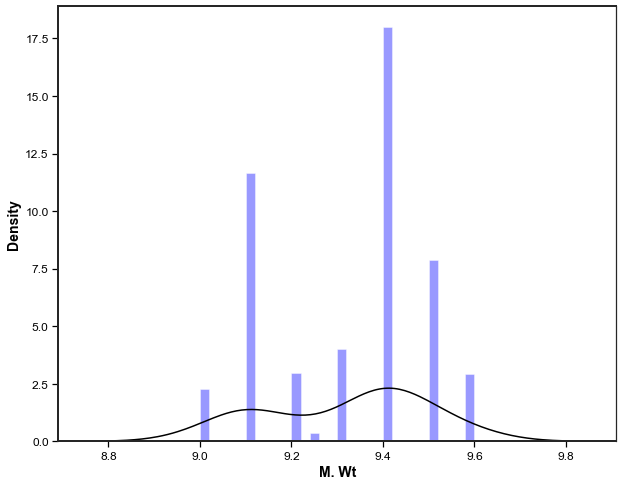

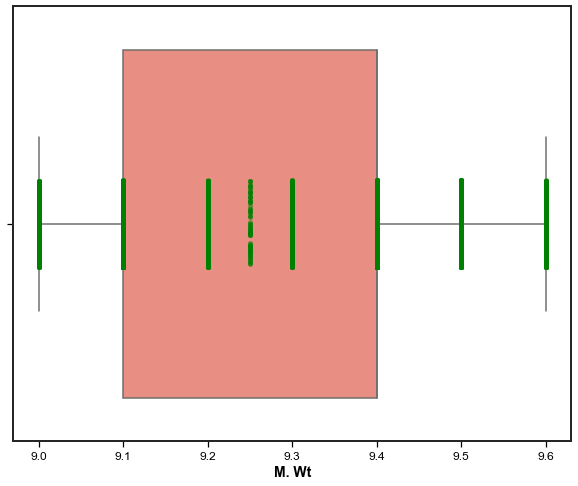

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M. T. in</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M. T. in:</h3></div>

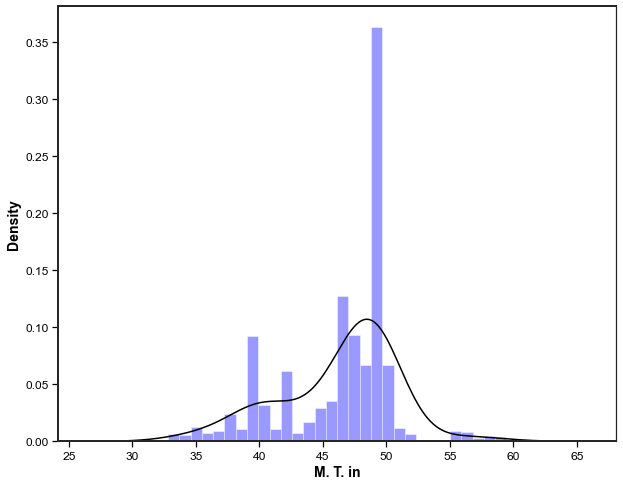

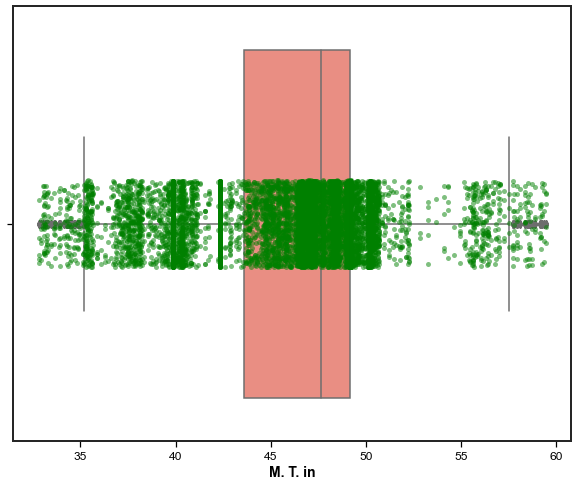

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M. T. out</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M. T. out:</h3></div>

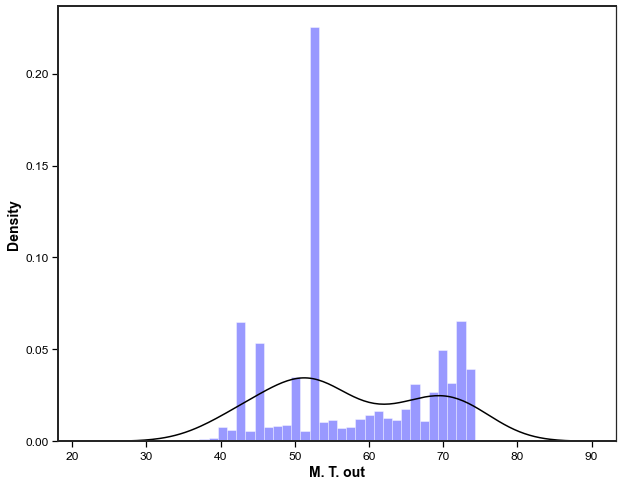

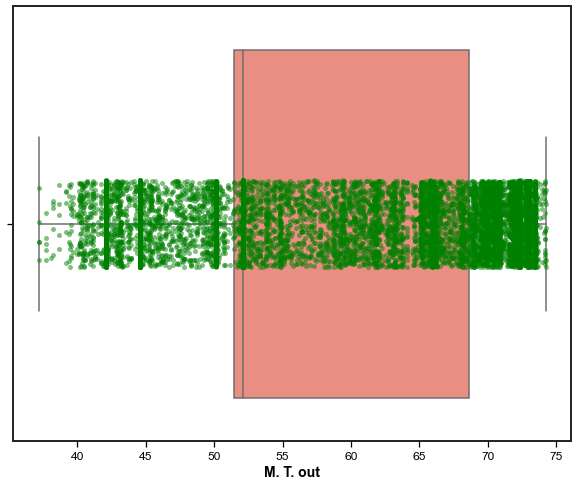

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Vib. Count</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Vib. Count:</h3></div>

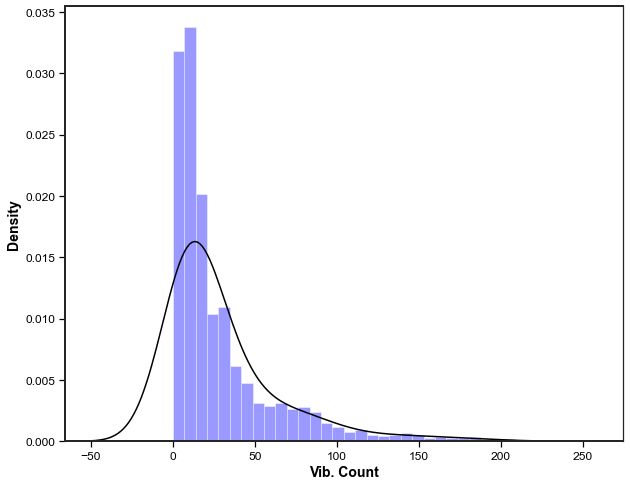

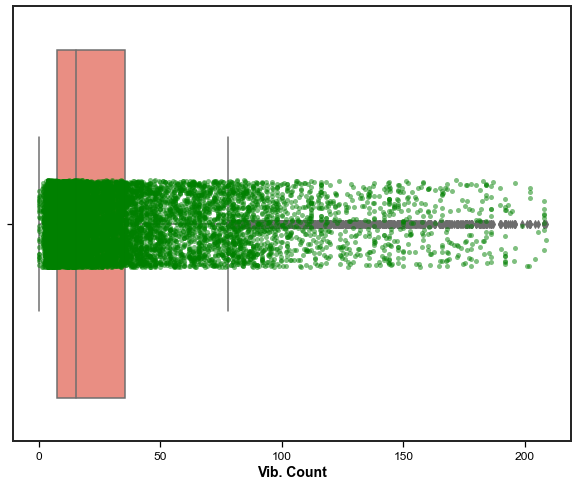

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Lateral Vib.</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Lateral Vib.:</h3></div>

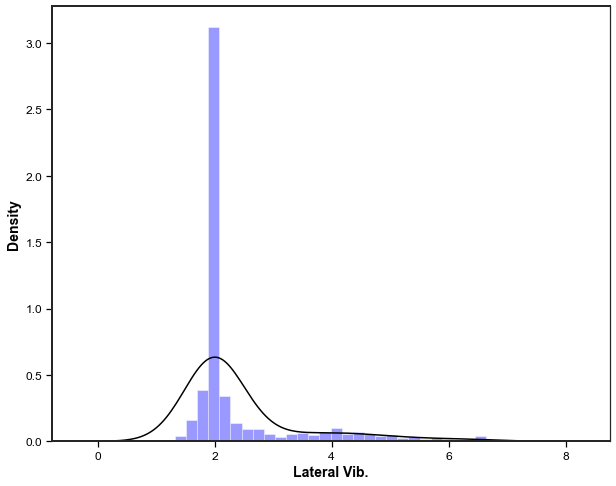

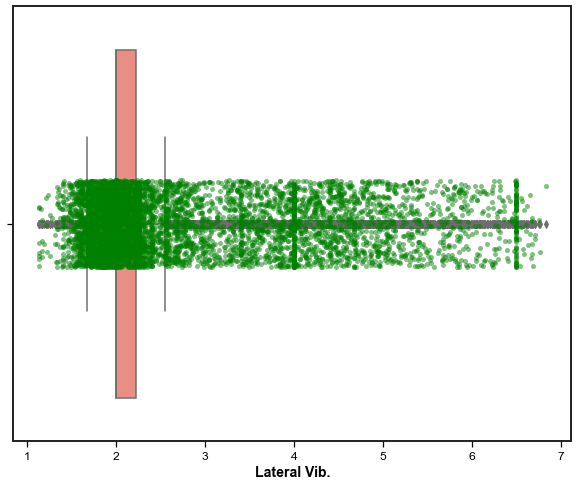

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Axial Vib.</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Axial Vib.:</h3></div>

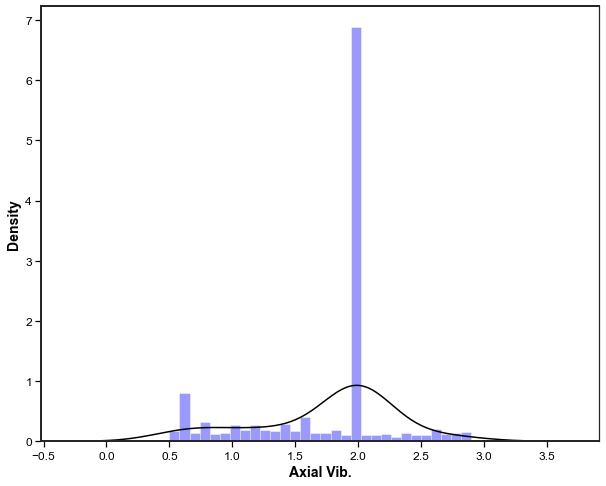

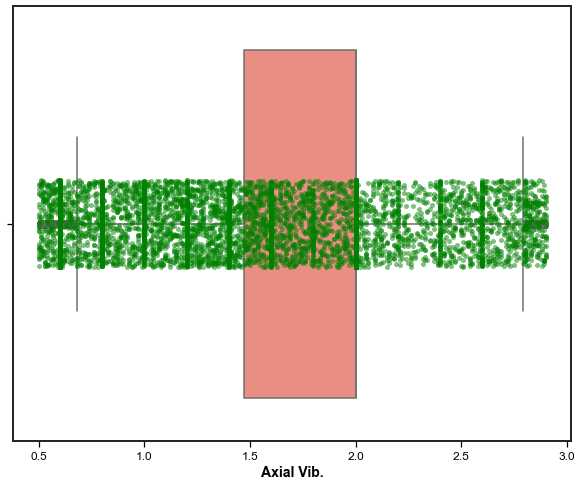

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>SS%</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for SS%:</h3></div>

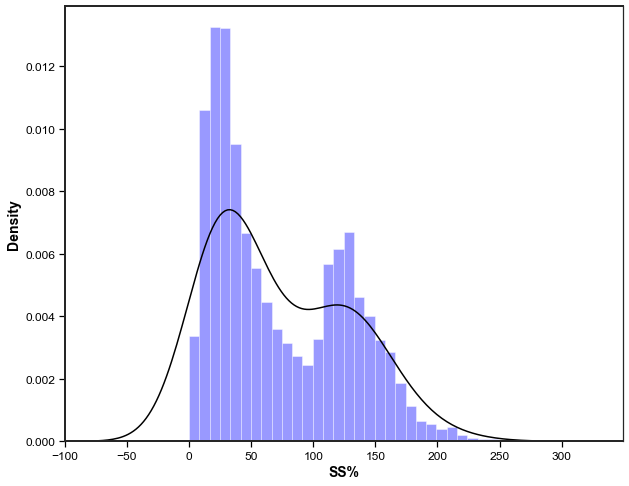

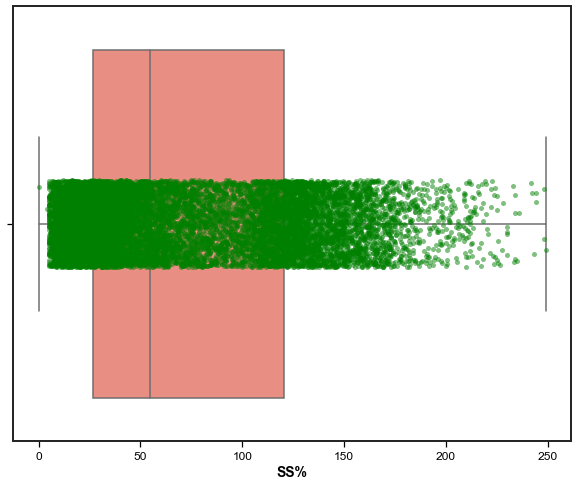

In [147]:
from IPython.display import Markdown, display

# External dictionary with column descriptions
column_descriptions = {
    'MD(mt)': 'Description for Column1.',
    'Column2': 'Description for Column2.',
    # Add descriptions for other columns
}

for col in well_Data.columns:
    # Fetch the description from the external dictionary
    column_description = column_descriptions.get(col, 'No description available.')

    # Create the header with description
    header = f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{col}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Run your analysis function
    Num_feature_analysis(well_Data, col)


  <div style="color:yellow;display:fill;border-radius:8px;
            background-color:#ffcc00;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:black;"><b> Correlation Matrix   </b></p>
</div>

In [148]:
import seaborn as sns

def corrMat(df, title='Correlation Matrix', figsize=(12, 8), save_path=None):
    
    corr_mat = df.corr().round(2)

    f, ax = plt.subplots(figsize=figsize)
    mask = np.zeros_like(corr_mat, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    sns.heatmap(corr_mat, mask=mask, vmin=-1, vmax=1, center=0,
                cmap='viridis', square=True, linewidths=.5,
                annot=True, cbar=True, fmt='.2f')

    plt.title(title, fontsize=16, fontweight='bold', color='black')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tick_params(axis='x', colors='black', labelsize=14)
    plt.tick_params(axis='y', colors='black', labelsize=14)
    plt.savefig(f'Correlation Matrix.png')
    plt.show()
    plt.close()    
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')

    plt.show()

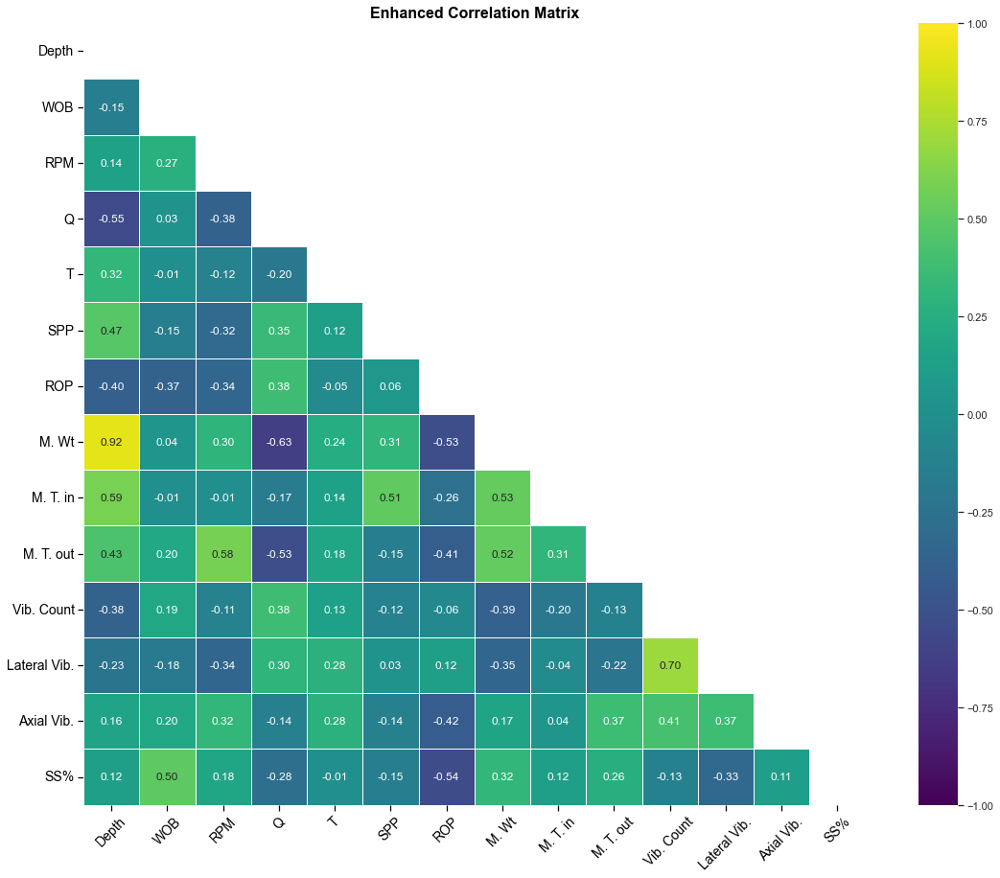

<Figure size 720x432 with 0 Axes>

In [149]:
corrMat(well_Data, title='Enhanced Correlation Matrix', figsize=(20, 15), save_path='correlation_matrix.png')

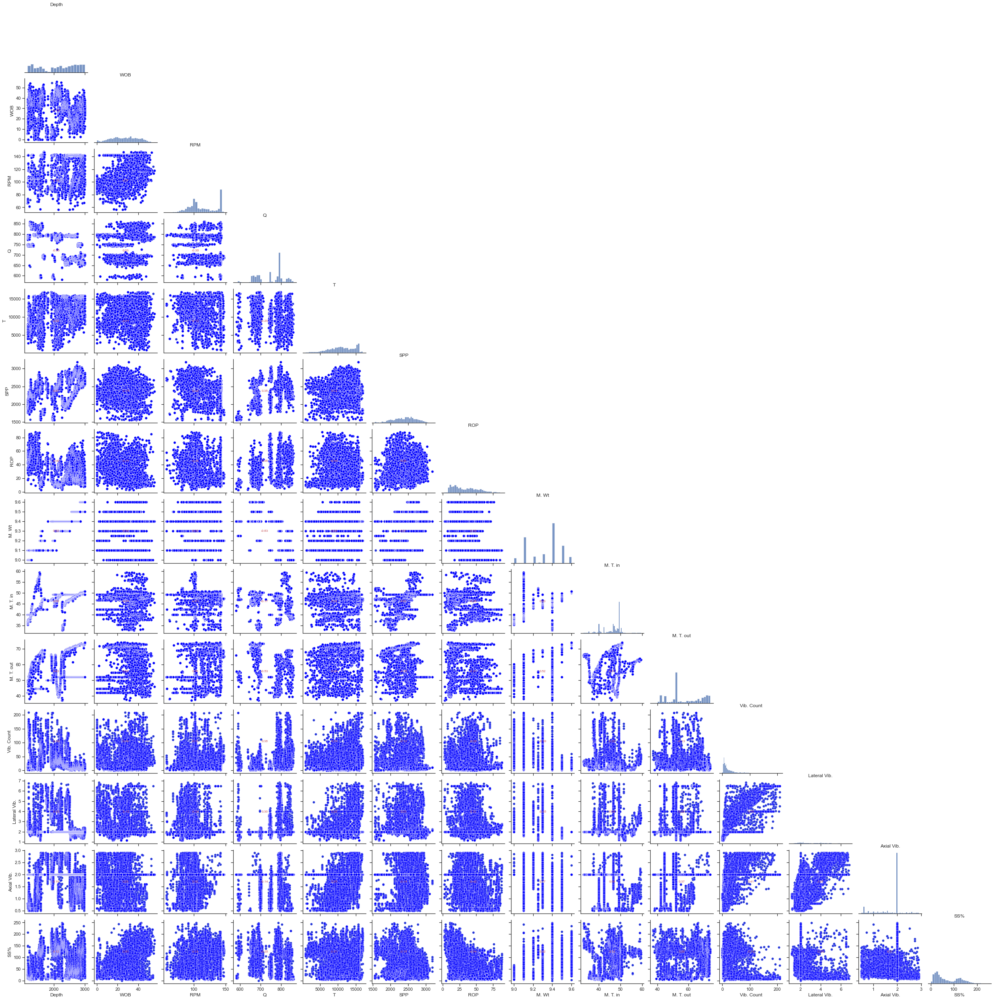

In [150]:
# Set style and color codes
sns.set(style="ticks", color_codes=True)

# Create pairplot showing only the lower triangle
pair_plot = sns.pairplot(well_Data, corner=True)

# Set title
#pair_plot.fig.suptitle("Pairplot of Well Data with Column Headers", y=1.02)

# Show column headers on the diagonal axes
for i, text in enumerate(pair_plot.diag_axes):
    text.set_title(well_Data.columns[i])

# Customize plot appearance
pair_plot.map_lower(sns.scatterplot, color='blue',alpha=0.5)  # Customize lower triangle with scatter plots

# Add correlation coefficients
corr_values = well_Data.corr().values
for i, (ax_row, ax_col) in enumerate(zip(pair_plot.axes, pair_plot.axes.T)):
    for j, ax in enumerate(ax_col):
        if i < j:
            ax.annotate(f"{corr_values[i, j]:.2f}", xy=(0.5, 0.5), xycoords="axes fraction",
                        ha="center", va="center", fontsize=8, color="r")

# Adjust plot layout
pair_plot.fig.subplots_adjust(wspace=0.1, hspace=0.1)

# Display the plot
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tick_params(axis='x', colors='black', labelsize=16)
plt.tick_params(axis='y', colors='black', labelsize=16)
plt.savefig(f'Pair Plot.png')
plt.show()
plt.close()    


# <b>7<span style='color:#0000FF'>|</span> Split Dataset for Training and Testing </b>

In [151]:
target_columns=['Vib. Count','Lateral Vib.','Axial Vib.','SS%']

# Drop columns only if they exist in the DataFrame
cols_to_drop = list(set(target_columns).intersection(well_Data.columns))
features = well_Data.drop(cols_to_drop, axis=1)

# Select target columns
targets = well_Data[target_columns]

# fill missing values using mean
features = features.fillna(features.mean())
targets = targets.fillna(targets.mean())

# Splitting into train and test sets (80% train, 20% test)
x_train, x_test, y_train, y_test = train_test_split(features, targets, shuffle=True, test_size=0.2, random_state=44)

# Further split the training data into train and validation sets (80% train, 10% validation)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, shuffle=True, test_size=0.125, random_state=44)

print('Shape of training feature:', x_train.shape)
print('Shape of validation feature:', x_val.shape)
print('Shape of testing feature:', x_test.shape)
print('Shape of training label:', y_train.shape)
print('Shape of validation label:', y_val.shape)
print('Shape of testing label:', y_test.shape)


Shape of training feature: (9162, 10)
Shape of validation feature: (1309, 10)
Shape of testing feature: (2618, 10)
Shape of training label: (9162, 4)
Shape of validation label: (1309, 4)
Shape of testing label: (2618, 4)


# <b>8<span style='color:#0000FF'>|</span> Standrization </b>

In [152]:
# Scaling the features
scaler = StandardScaler()
scaler.fit(x_train)

x_train_scaled = scaler.transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

# <b>9 <span style='color:#0000FF'>|</span> Modeling </b>

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Linear Regression</h1><p>Replace with your model description</p></div>

Training MSE Score: 523.7583088468749
Training RMSE Score: 22.8857665121113
Training R-squared: 0.4178260191140465
Validation MSE Score: 536.8648997813739
Validation RMSE Score: 23.170345266770926
Validation R-squared: 0.4026259813799774
Testing MSE Score: 527.9395681241859
Testing RMSE Score: 22.97693556861284
Testing R-squared: 0.4115839826003547
------------------------------


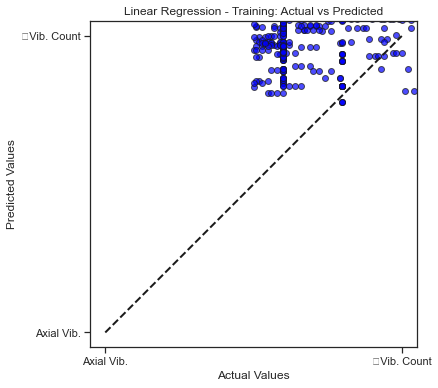

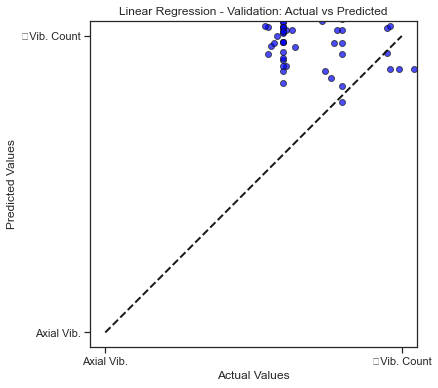

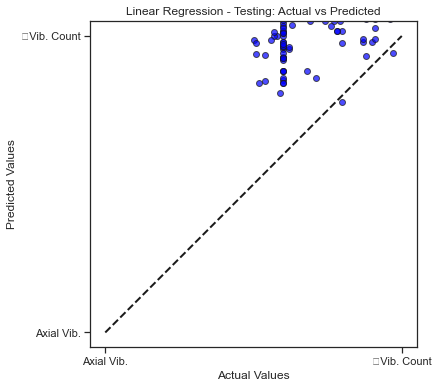

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Ridge Regression</h1><p>Replace with your model description</p></div>

Training MSE Score: 523.7585967434939
Training RMSE Score: 22.885772801972273
Training R-squared: 0.4178258265085403
Validation MSE Score: 536.8353856080747
Validation RMSE Score: 23.169708362602986
Validation R-squared: 0.40262812190107855
Testing MSE Score: 527.9229442650537
Testing RMSE Score: 22.97657381475867
Testing R-squared: 0.411587867185353
------------------------------


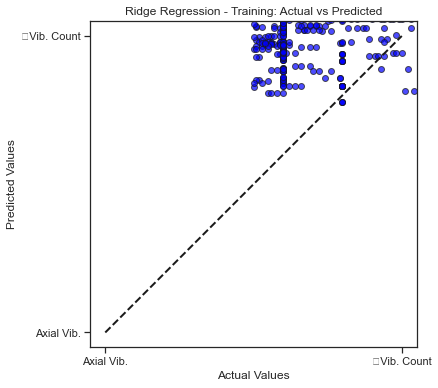

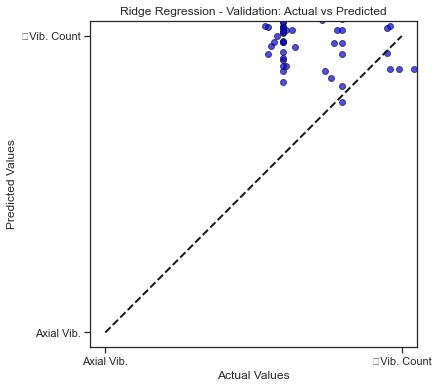

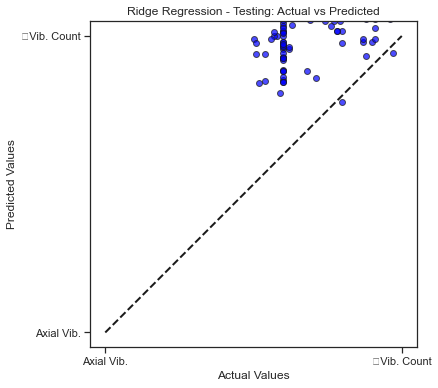

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Lasso Regression</h1><p>Replace with your model description</p></div>

Training MSE Score: 538.7343135472014
Training RMSE Score: 23.210650864359692
Training R-squared: 0.21629293037540923
Validation MSE Score: 545.3666254650634
Validation RMSE Score: 23.353085994468984
Validation R-squared: 0.20393742867404369
Testing MSE Score: 541.739815025597
Testing RMSE Score: 23.275304832066045
Testing R-squared: 0.21345420449410488
------------------------------


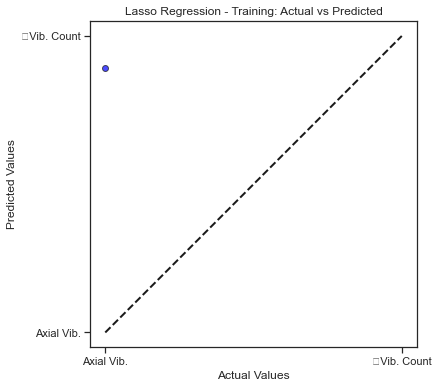

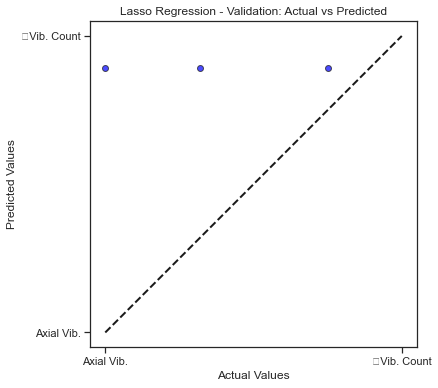

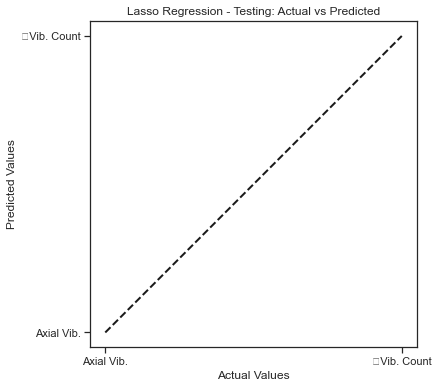

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Elastic Net</h1><p>Replace with your model description</p></div>

Training MSE Score: 608.389203466419
Training RMSE Score: 24.665546891695286
Training R-squared: 0.18243652544589667
Validation MSE Score: 607.1561192504676
Validation RMSE Score: 24.640538128264723
Validation R-squared: 0.17238380166349515
Testing MSE Score: 612.4258735882861
Testing RMSE Score: 24.747239716547906
Testing R-squared: 0.18016559095421159
------------------------------


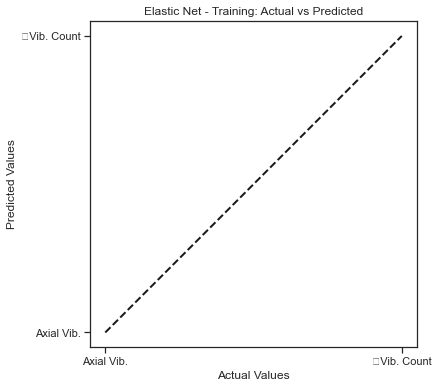

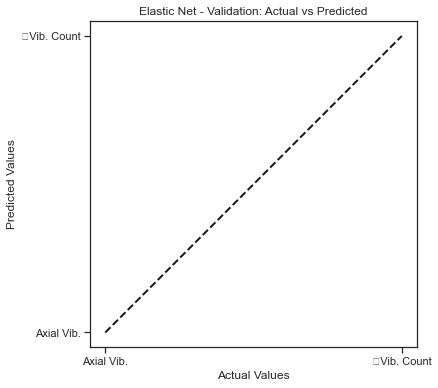

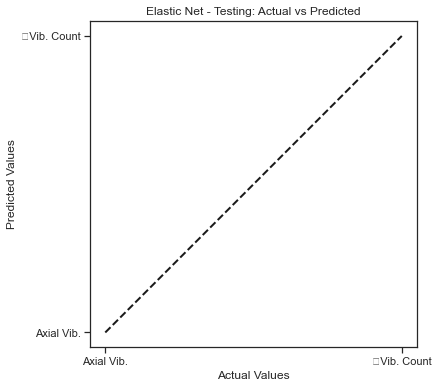

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>KNN Regressor</h1><p>Replace with your model description</p></div>

Training MSE Score: 74.8505703625849
Training RMSE Score: 8.651622412159751
Training R-squared: 0.9377157414934747
Validation MSE Score: 148.77419513445392
Validation RMSE Score: 12.197302781125584
Validation R-squared: 0.858806349471149
Testing MSE Score: 129.92966660962577
Testing RMSE Score: 11.39866951050103
Testing R-squared: 0.8827555399392675
------------------------------


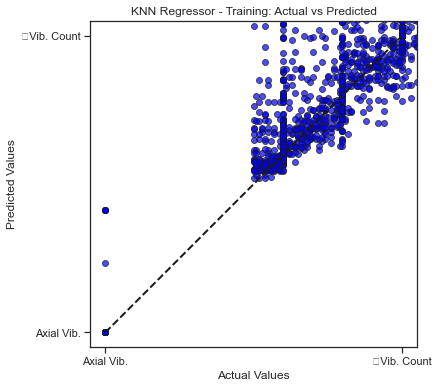

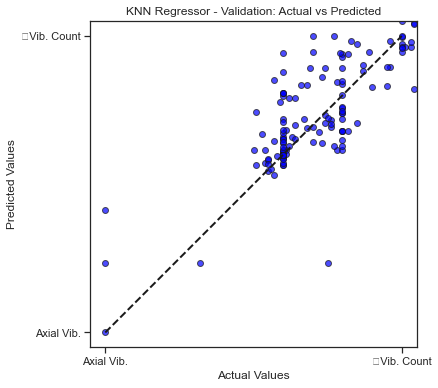

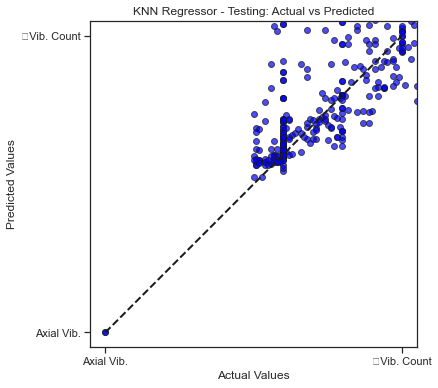

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Decision Tree</h1><p>Replace with your model description</p></div>

Training MSE Score: 0.0
Training RMSE Score: 0.0
Training R-squared: 1.0
Validation MSE Score: 101.53203254392663
Validation RMSE Score: 10.076310462859242
Validation R-squared: 0.9054798305048996
Testing MSE Score: 69.00933750954918
Testing RMSE Score: 8.307185895930655
Testing R-squared: 0.9496775722632795
------------------------------


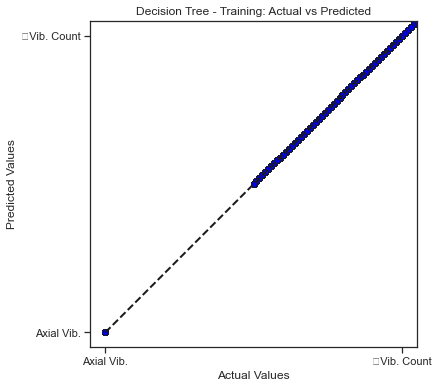

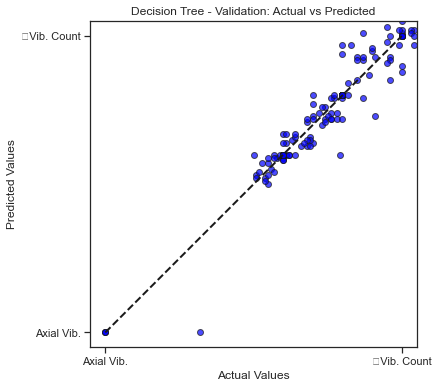

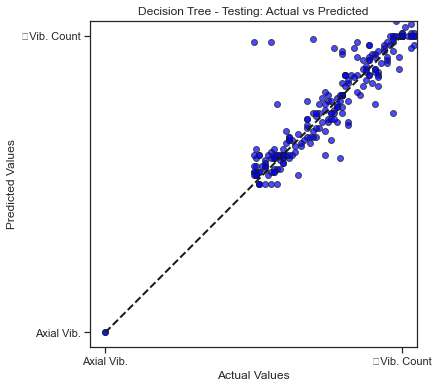

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>Replace with your model description</p></div>

Training MSE Score: 9.309648682657404
Training RMSE Score: 3.051171690131089
Training R-squared: 0.993193033021665
Validation MSE Score: 84.25813279742556
Validation RMSE Score: 9.179222886357296
Validation R-squared: 0.9293131119003322
Testing MSE Score: 61.10725625648209
Testing RMSE Score: 7.817113038486912
Testing R-squared: 0.9563916072567455
------------------------------


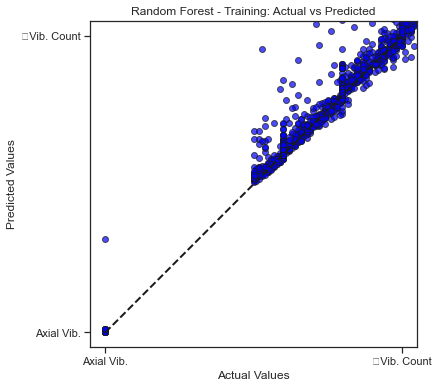

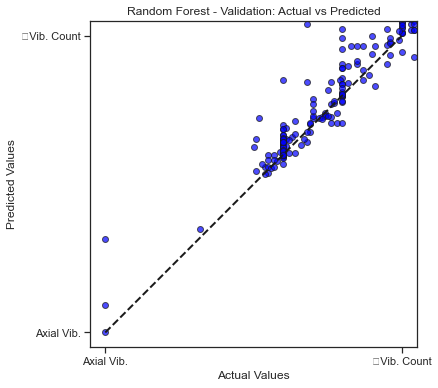

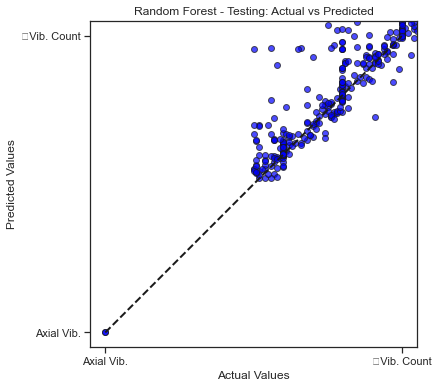

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>XGBoost</h1><p>Replace with your model description</p></div>

Training MSE Score: 33.898690606471646
Training RMSE Score: 5.822258205067141
Training R-squared: 0.9798089276958065
Validation MSE Score: 99.89468191332993
Validation RMSE Score: 9.994732708448483
Validation R-squared: 0.9208106597672091
Testing MSE Score: 79.26110431230668
Testing RMSE Score: 8.902870565851595
Testing R-squared: 0.9451897558553645
------------------------------


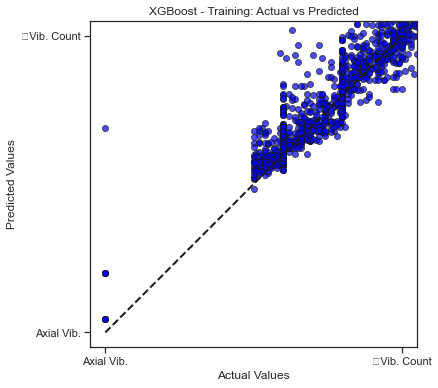

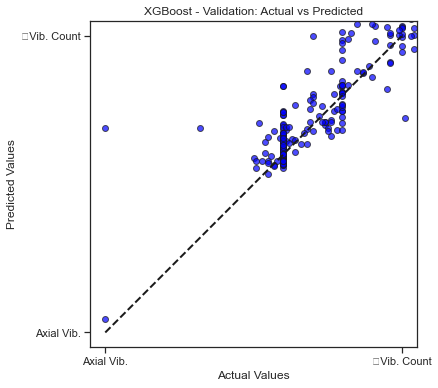

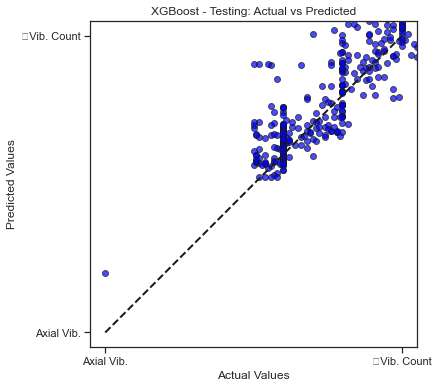

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>MLPRegressor</h1><p>Replace with your model description</p></div>

Training MSE Score: 271.8640219397822
Training RMSE Score: 16.48829954664162
Training R-squared: 0.6838819998201813
Validation MSE Score: 291.5789690155589
Validation RMSE Score: 17.075683559247604
Validation R-squared: 0.6637155032000138
Testing MSE Score: 278.15615747333226
Testing RMSE Score: 16.678014194541635
Testing R-squared: 0.6678792002263296
------------------------------


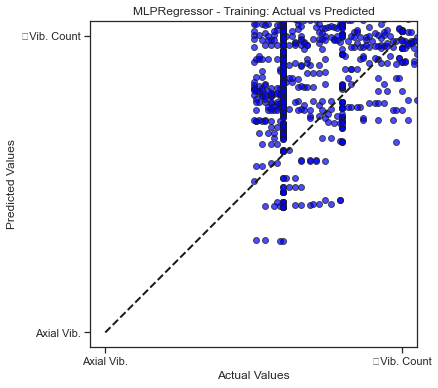

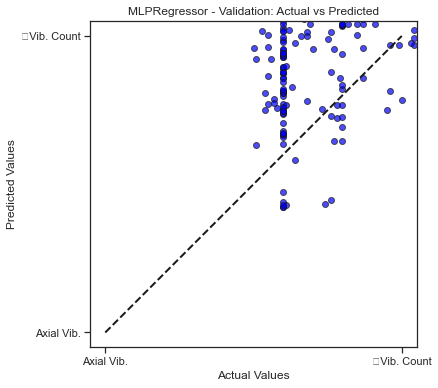

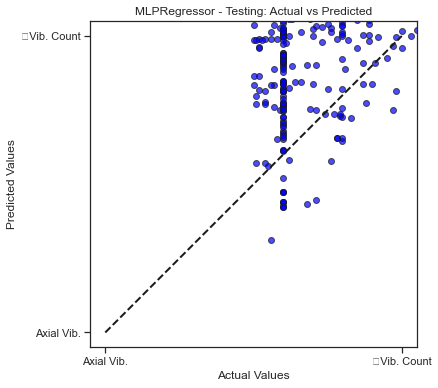


Best Model based on Validation R-squared Score: Random Forest with R-squared Score of 0.9293


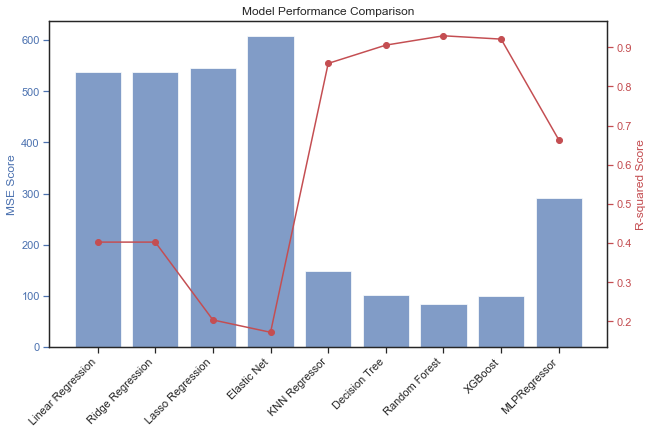

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler
from IPython.display import display, Markdown
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor

# Function to visualize actual vs predicted values
def visualize_predictions(model_name, y_true, y_pred, dataset_name):
    # Set equal aspect ratio
    plt.gca().set_aspect('equal', adjustable='box')
    plt.scatter(y_true, y_pred, c='blue', edgecolors='k', alpha=0.7)
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'k--', lw=2)  # Ideal line
    plt.title(f'{model_name} - {dataset_name}: Actual vs Predicted')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.show()

# Splitting the data into train, validation, and test sets
# Assuming you have already split your data into x_train, x_val, x_test, y_train, y_val, and y_test
# Scale the features
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

# Model definitions
    
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Elastic Net": ElasticNet(),
    "KNN Regressor": KNeighborsRegressor(), 
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "XGBoost": XGBRegressor(),
    "MLPRegressor": MLPRegressor()
}

# Lists to store results for visualization
mse_scores = []
r2_scores = []
rmse_scores_train = []
rmse_scores_val = []
rmse_scores_test = []

best_model_name = None
best_r2_score = -np.inf  # Initialize with negative infinity

for name, model in models.items():

    # Fetch the description from the external dictionary (replace with your descriptions)
    column_description = "Replace with your model description"
    
    # Create the header with description
    header = f"<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{name}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Fit the model
    model.fit(x_train_scaled, y_train)
    
    # Predictions on the training, validation, and testing data
    y_pred_train = model.predict(x_train_scaled)
    y_pred_val = model.predict(x_val_scaled)
    y_pred_test = model.predict(x_test_scaled)
    
    # Compute MSE, RMSE, and R-squared scores
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    mse_val = mean_squared_error(y_val, y_pred_val)
    rmse_val = np.sqrt(mse_val)
    r2_val = r2_score(y_val, y_pred_val)
    
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    mse_scores.append((name, mse_val))  # Use the validation MSE for comparison
    r2_scores.append((name, r2_val))
    rmse_scores_train.append((name, rmse_train))
    rmse_scores_val.append((name, rmse_val))
    rmse_scores_test.append((name, rmse_test))
    
    print(f'Training MSE Score: {mse_train}')
    print(f'Training RMSE Score: {rmse_train}')
    print(f'Training R-squared: {r2_train}')
    print(f'Validation MSE Score: {mse_val}')
    print(f'Validation RMSE Score: {rmse_val}')
    print(f'Validation R-squared: {r2_val}')
    print(f'Testing MSE Score: {mse_test}')
    print(f'Testing RMSE Score: {rmse_test}')
    print(f'Testing R-squared: {r2_test}')
    print('-' * 30)
    
    # Check if the current model has a higher R-squared score than the current best
    if r2_val > best_r2_score:
        best_r2_score = r2_val
        best_model_name = name
    
    # Visualize predictions for training, validation, and testing data
    visualize_predictions(name, y_train, y_pred_train, 'Training')
    visualize_predictions(name, y_val, y_pred_val, 'Validation')
    visualize_predictions(name, y_test, y_pred_test, 'Testing')

# Visualize MSE scores
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar([model[0] for model in mse_scores], [model[1] for model in mse_scores], color='b', alpha=0.7)
ax1.set_ylabel('MSE Score', color='b')
ax1.set_xticklabels([model[0] for model in mse_scores], rotation=45, ha='right')
ax1.tick_params('y', colors='b')

# Create a second y-axis for R-squared scores
ax2 = ax1.twinx()
ax2.plot([model[0] for model in r2_scores], [model[1] for model in r2_scores], color='r', marker='o')
ax2.set_ylabel('R-squared Score', color='r')
ax2.tick_params('y', colors='r')

plt.title('Model Performance Comparison')

# Print the best model
print(f'\nBest Model based on Validation R-squared Score: {best_model_name} with R-squared Score of {best_r2_score:.4f}')

plt.show()


<p style= "font-family:Georgia;color:#000000;font-size:110%;text-align:center;border-radius:10px 10px;border-style: solid;border-width:5px;border-color:#fbff00;"><br>The best models' results is <b>RandomForestRegressor<b></b>
    <br></p>
    

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Linear Regression</h1><p>Replace with your model description</p></div>

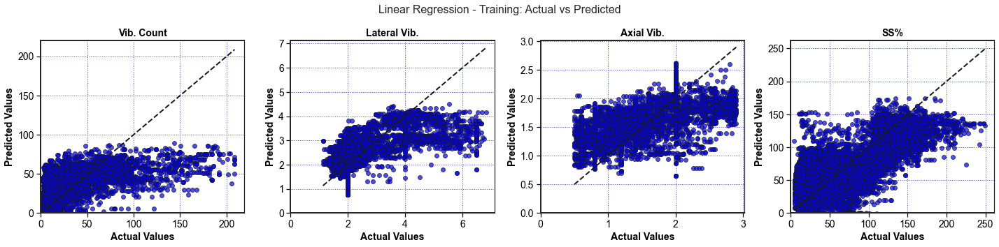

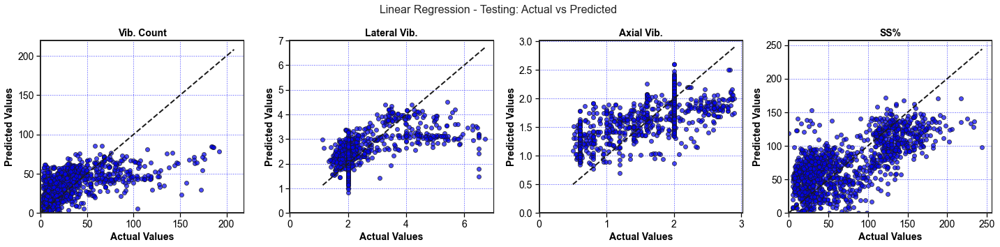

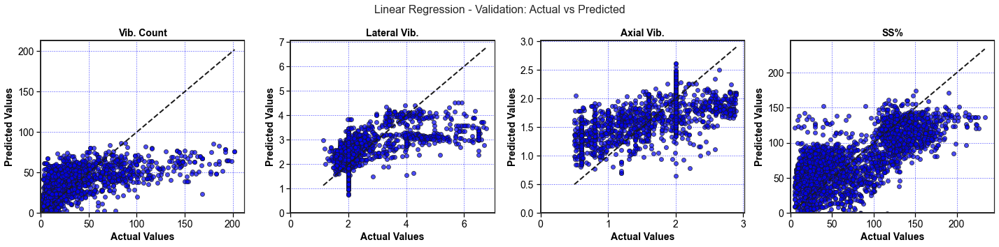

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Ridge Regression</h1><p>Replace with your model description</p></div>

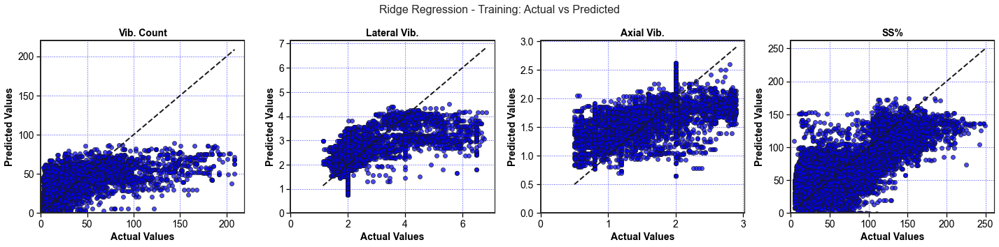

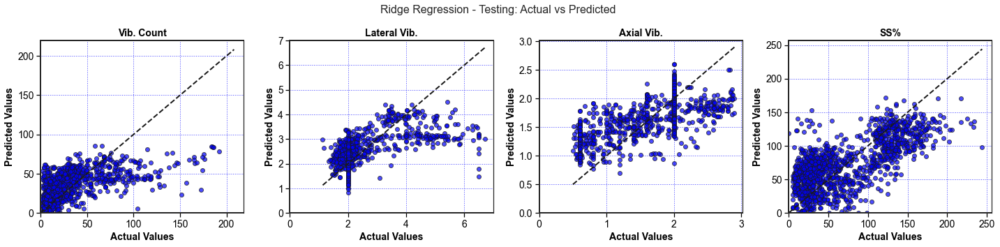

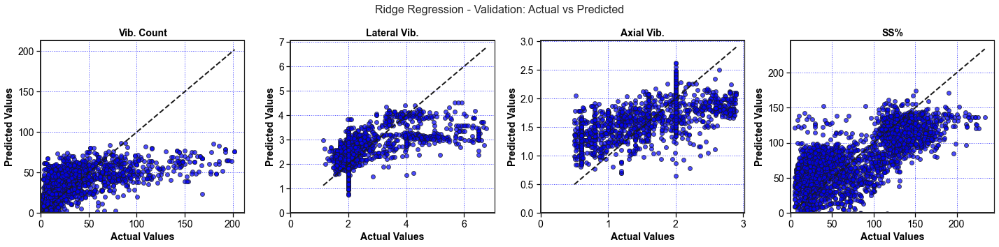

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Lasso Regression</h1><p>Replace with your model description</p></div>

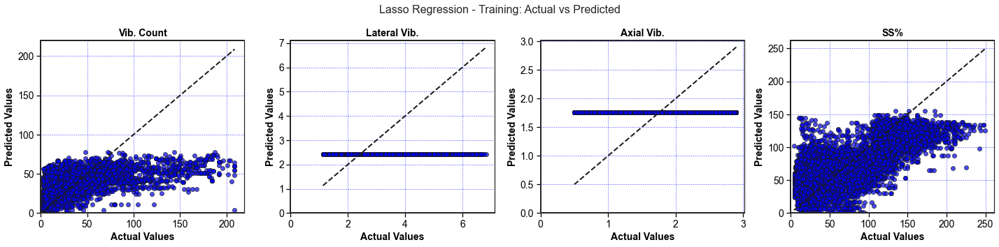

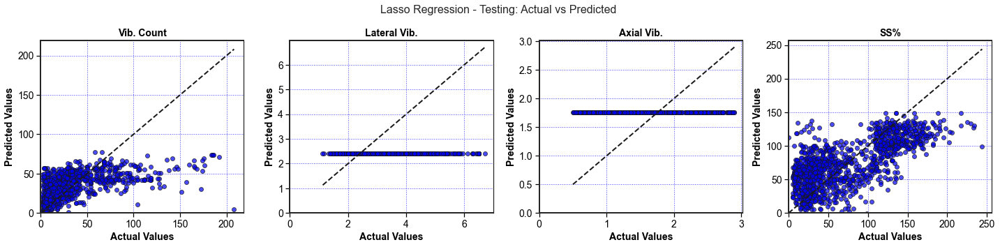

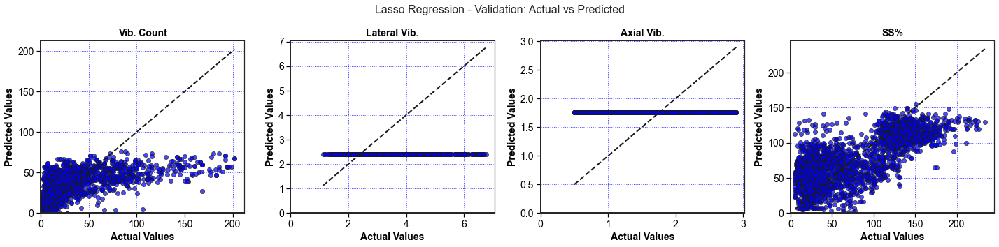

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Elastic Net</h1><p>Replace with your model description</p></div>

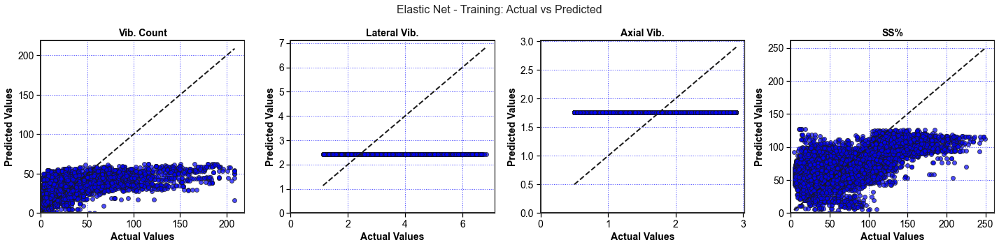

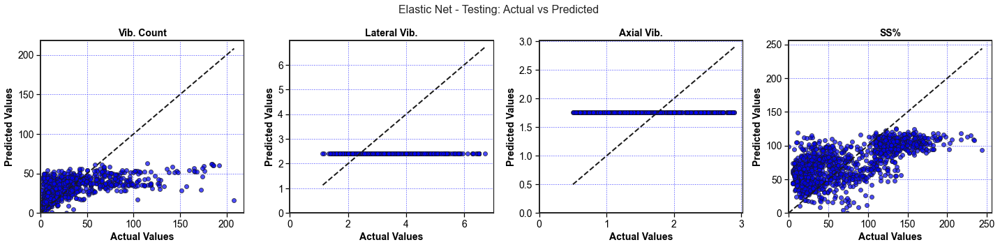

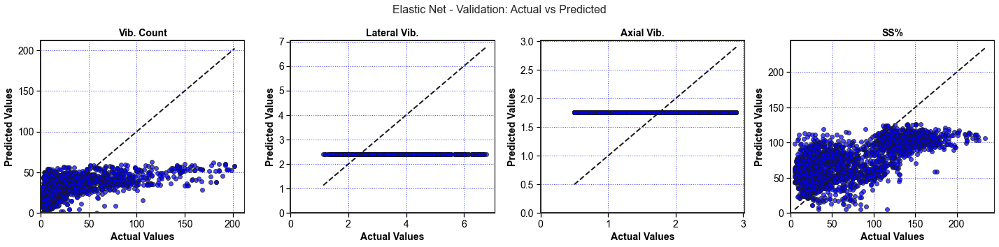

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>KNN Regressor</h1><p>Replace with your model description</p></div>

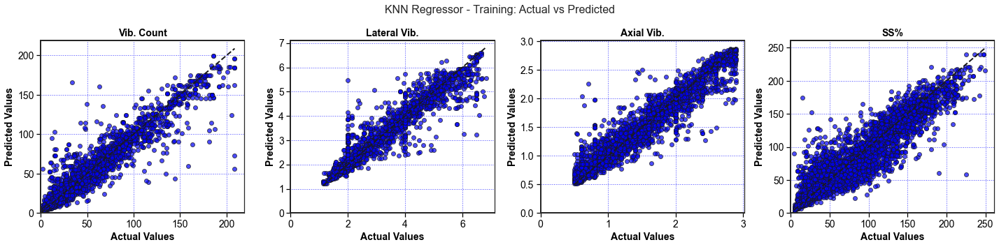

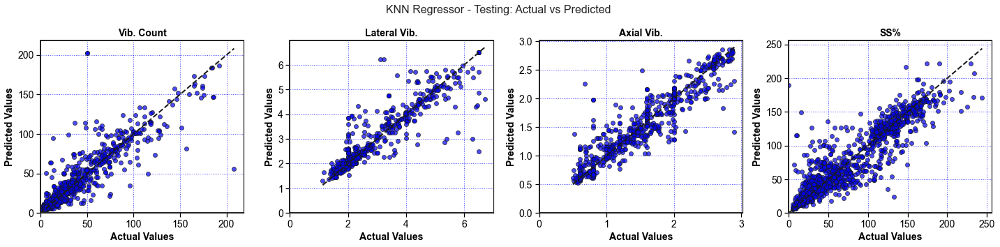

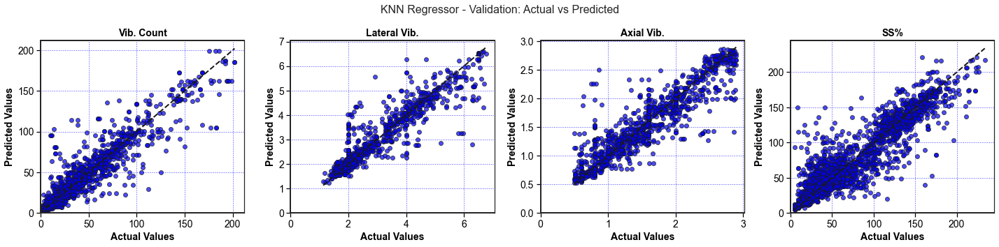

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Decision Tree</h1><p>Replace with your model description</p></div>

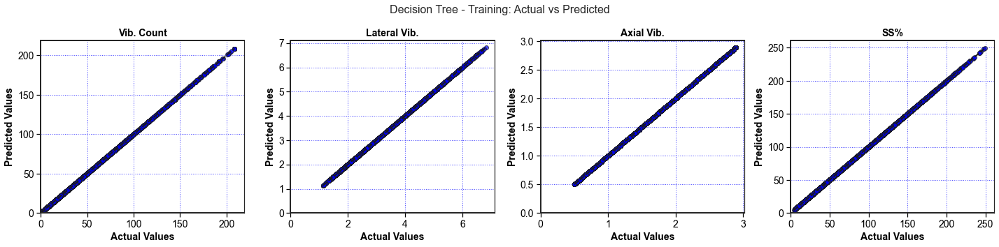

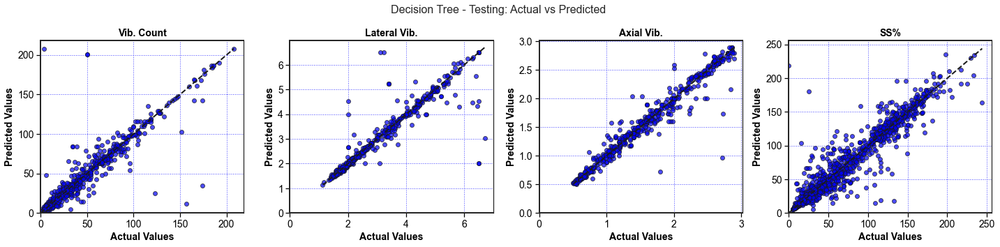

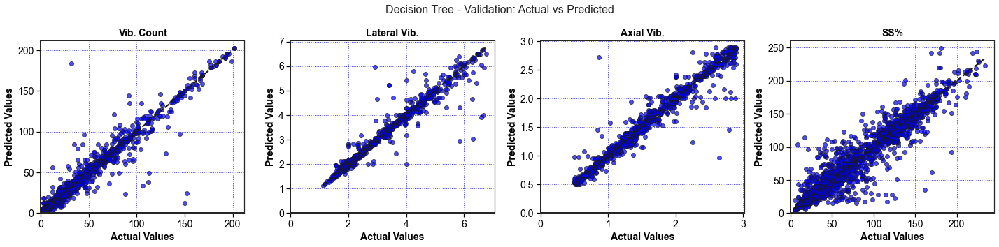

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>Replace with your model description</p></div>

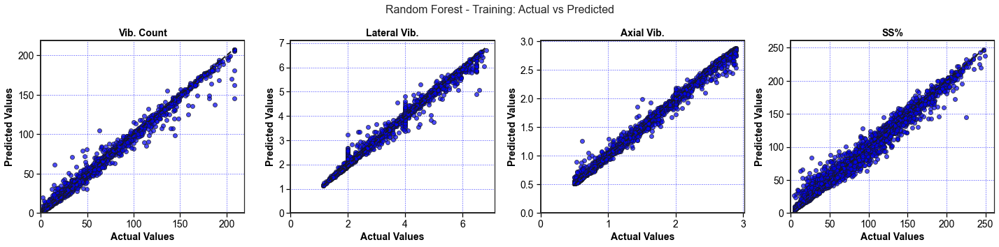

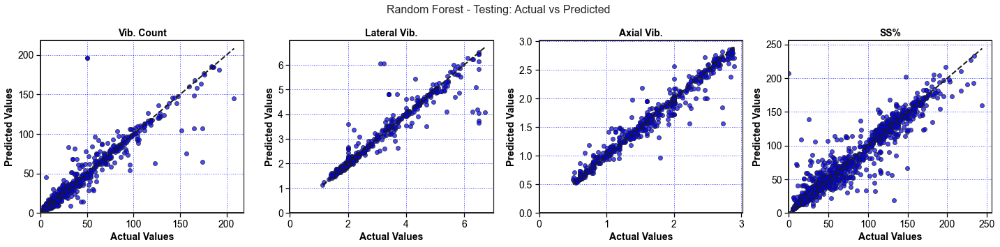

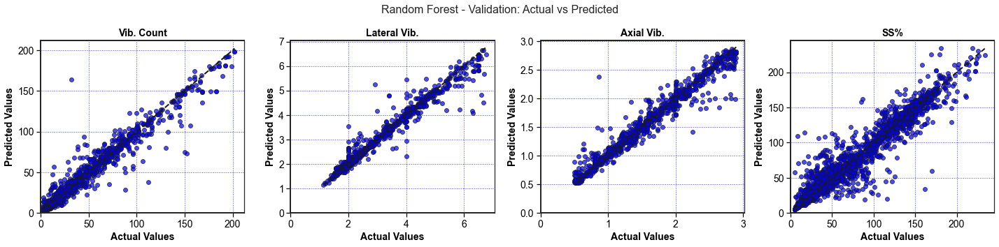

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>XGBoost</h1><p>Replace with your model description</p></div>

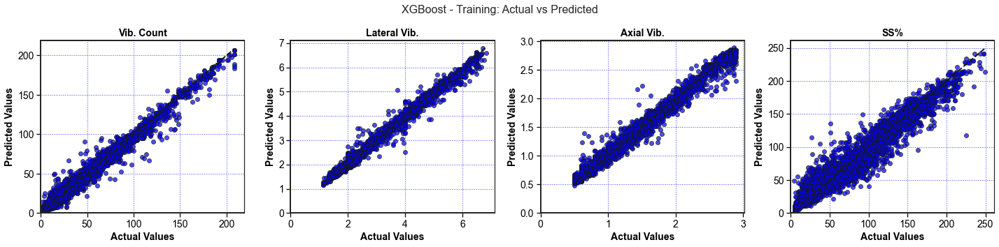

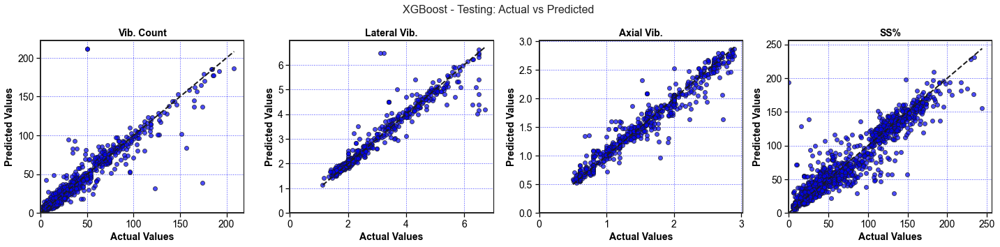

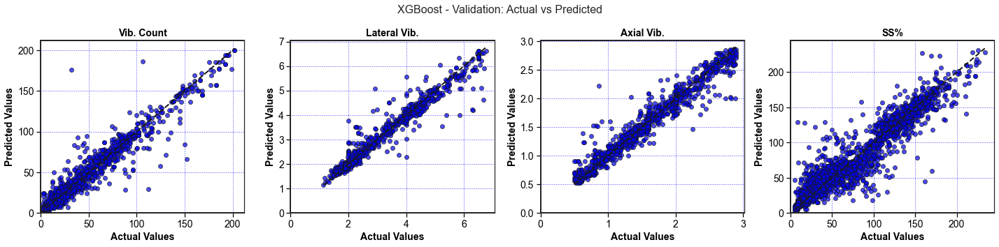

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>MLPRegressor</h1><p>Replace with your model description</p></div>

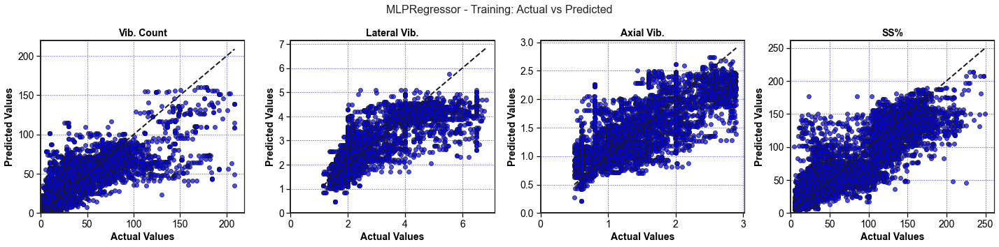

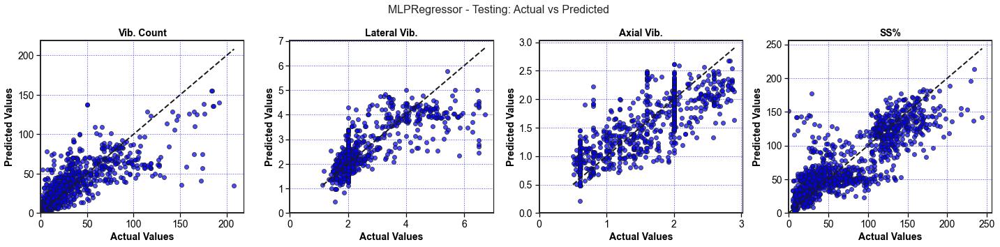

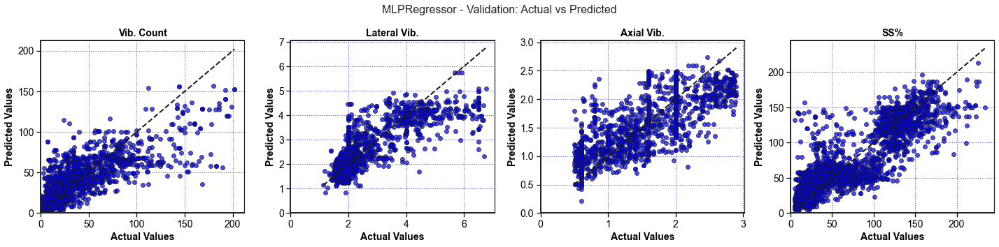

In [153]:
# Function to visualize actual vs predicted values for multiple target columns
def visualize_predictions(model_name, y_true, y_pred, dataset_name, target_columns):
    num_cols = len(target_columns)
    fig, axs = plt.subplots(1, num_cols, figsize=(5*num_cols, 5))
    fig.suptitle(f'{model_name} - {dataset_name}: Actual vs Predicted', fontsize=16)

    for i, target_col in enumerate(target_columns):
        axs[i].scatter(y_true[:, i], y_pred[:, i], c='blue', edgecolors='k', alpha=0.7)
        axs[i].plot([min(y_true[:, i]), max(y_true[:, i])], [min(y_true[:, i]), max(y_true[:, i])], 'k--', lw=2)  # Ideal line
        # Add grid with customized style
        axs[i].grid(True, linestyle=':', linewidth=1, color='blue', alpha=0.7)
        axs[i].set_xlim(0)
        axs[i].set_ylim(0)
        axs[i].set_title(f'{target_col}', fontweight='bold', color='black', fontsize=14)
        axs[i].set_xlabel('Actual Values', fontweight='bold', color='black', fontsize=14)
        axs[i].set_ylabel('Predicted Values', fontweight='bold', color='black', fontsize=14)
        axs[i].tick_params(axis='x', colors='black', labelsize=14)
        axs[i].tick_params(axis='y', colors='black', labelsize=14)
        axs[i].spines['bottom'].set_linewidth(2)  # Set bottom axis line width
        axs[i].spines['left'].set_linewidth(2)    # Set left axis line width
        axs[i].spines['left'].set_linewidth(2)    # Set left axis line width
        axs[i].spines['top'].set_linewidth(2)   # Hide the top axis line

    plt.tight_layout()
    plt.show()

# Assuming you have y_train, y_val, y_test for each target column
y_train_all = np.array([y_train[col].values for col in target_columns]).T
y_val_all = np.array([y_val[col].values for col in target_columns]).T
y_test_all = np.array([y_test[col].values for col in target_columns]).T

for name, model in models.items():
    # Fetch the description from the external dictionary (replace with your descriptions)
    column_description = "Replace with your model description"
    
    # Create the header with description
    header = f"<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{name}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Fit the model
    model.fit(x_train_scaled, y_train_all)
    
    # Predictions on the training, validation, and testing data
    y_pred_train = model.predict(x_train_scaled)
    y_pred_val = model.predict(x_val_scaled)
    y_pred_test = model.predict(x_test_scaled)
    
    # Visualize predictions for training, validation, and testing data
    visualize_predictions(name, y_train_all, y_pred_train, 'Training', target_columns)
    visualize_predictions(name, y_val_all, y_pred_val, 'Testing', target_columns)
    visualize_predictions(name, y_test_all, y_pred_test, 'Validation', target_columns)


<div style="color:yellow;display:fill;border-radius:8px;
            background-color:#ffcc00;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:black;"><b> RandomForestRegressor() | Hyperparameters tuning </b></p>
</div>

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>Replace with your model description</p></div>

Training R-squared: 0.9932827839070881
Validation R-squared: 0.9307306634617092
Testing R-squared: 0.9577417734442741
Training MAE: 1.0105369733682608
Validation MAE: 2.84081415202445
Testing MAE: 2.7223785523300243


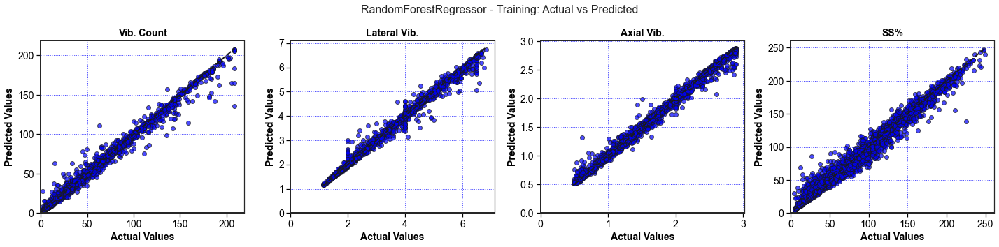

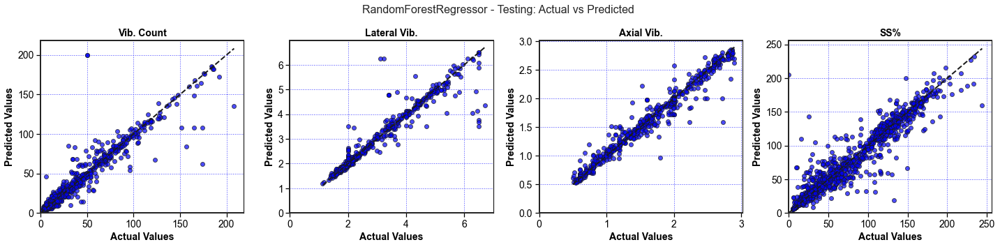

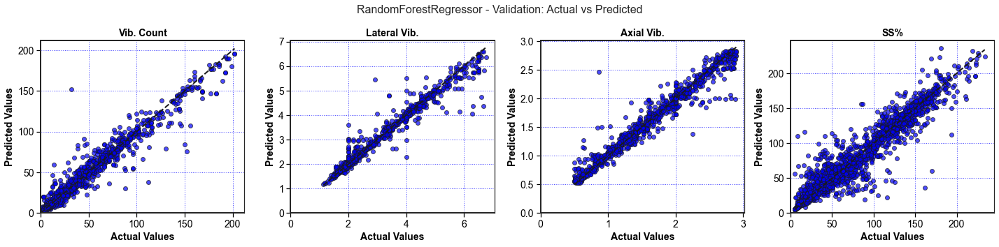

In [154]:
from sklearn.ensemble import RandomForestRegressor

# Specify the best hyperparameters for Random Forest
best_rf_hyperparameters = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

# Create the Random Forest model with the best hyperparameters
model = RandomForestRegressor(**best_rf_hyperparameters)

# Assuming you have y_train, y_val, y_test for each target column
y_train_all = np.array([y_train[col].values for col in target_columns]).T
y_val_all = np.array([y_val[col].values for col in target_columns]).T
y_test_all = np.array([y_test[col].values for col in target_columns]).T

# Fetch the description from the external dictionary (replace with your descriptions)
column_description = "Replace with your model description"

# Create the header with description
header = f"<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>{column_description}</p></div>"

# Display the header
display(Markdown(header))

# Fit the model
model.fit(x_train_scaled, y_train_all)

# Predictions on the training, validation, and testing data
y_pred_train = model.predict(x_train_scaled)
y_pred_val = model.predict(x_val_scaled)
y_pred_test = model.predict(x_test_scaled)

# Calculate accuracy values
train_accuracy = r2_score(y_train_all, y_pred_train)
val_accuracy = r2_score(y_val_all, y_pred_val)
test_accuracy = r2_score(y_test_all, y_pred_test)

train_mae = mean_absolute_error(y_train_all, y_pred_train)
val_mae = mean_absolute_error(y_val_all, y_pred_val)
test_mae = mean_absolute_error(y_test_all, y_pred_test)

# Display accuracy values
print("Training R-squared:", train_accuracy)
print("Validation R-squared:", val_accuracy)
print("Testing R-squared:", test_accuracy)

print("Training MAE:", train_mae)
print("Validation MAE:", val_mae)
print("Testing MAE:", test_mae)

name='RandomForestRegressor'

# Visualize predictions for training, validation, and testing data
visualize_predictions(name, y_train_all, y_pred_train, 'Training', target_columns)
visualize_predictions(name, y_val_all, y_pred_val, 'Testing', target_columns)
visualize_predictions(name, y_test_all, y_pred_test, 'Validation', target_columns)
